Project name: An Analysis of Nearpeer's Influence on Student Enrollment
Authors: Emmanual Owusu Asante, Obeng Adjei Paa Kwasi, Chinonso Ozoigbo, and David York
Assignment title:  
Assignment Objective:  
Data:  


### Load data

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import janitor

# Load the sample data from Excel
uni_data = pd.read_excel('data/Nearpeer Data Roux Analytics Class 040524.2 confidential.xlsx', sheet_name='University data').clean_names()
np_data = pd.read_excel('data/Nearpeer Data Roux Analytics Class 040524.2 confidential.xlsx', sheet_name='Nearpeer User data').clean_names()

print(f'The columns in uni_data are: {uni_data.columns}')
print(f'The shape of uni_data is {uni_data.shape}')
print(f'The columns in np_data are: {np_data.columns}')
print(f'The shape of np_data is {np_data.shape}')

# Initial data preprocessing (cleaning column names, setting the data types, merging the dataframes, etc.)

# Rename the primary key in uni_data to match the primary key in np_data
uni_data = uni_data.rename(columns={'nearpeer_user_id': 'user_id'})

# Convert the user_id column to int
uni_data['user_id'] = uni_data['user_id'].astype('Int64')
np_data['user_id'] = np_data['user_id'].astype('Int64')

# Merge the two dataframes
df = uni_data.merge(np_data, on='user_id')

# Convert the date columns to datetime
df['deposit_date'] = pd.to_datetime(df['deposit_date'])
df['last_activity_date'] = pd.to_datetime(df['last_activity_date'])
df['last_group_message'] = pd.to_datetime(df['last_group_message'])
df['first_invitation_date'] = pd.to_datetime(df['first_invitation_date'])
df['last_invitation_date'] = pd.to_datetime(df['last_invitation_date'])

# Remove '_y_n' from all column names
df.columns = df.columns.str.replace('_y_n', '')

# Remove trailing underscores from column names
df.columns = df.columns.str.rstrip('_')

# Replace '__' with '_' in column names
df.columns = df.columns.str.replace('__', '_')

# Rename 'bio_character_count_0_=_blank_optional_bio_field' to 'bio_character_count'
df = df.rename(columns={'bio_character_count_0_=_blank_optional_bio_field': 'bio_character_count'})

# Rename 'enrolled_at_census' to 'enrolled'
df = df.rename(columns={'enrolled_at_census': 'enrolled'})

# Replace 'Ceated before date tracking' with NaN in 'profile_completed_date'
df['profile_completed_date'] = df['profile_completed_date'].replace('Ceated before date tracking', np.nan)

# Convert 'profile_completed_date' to datetime
df['profile_completed_date'] = pd.to_datetime(df['profile_completed_date'])

# Replace all '---' with NaN
df = df.replace('---', np.nan)

# Define columns to convert to Int64
columns_to_convert_to_Int64 = [
    'total_friends', 'i_invited_and_they_accepted',
    'i_invited_but_they_have_not_responded_yet',
    'i_ignored_or_disconnected_from_them', 'they_invited_and_i_accepted',
    'they_invited_but_i_have_not_responded_yet',
    'they_disconnected_from_me', 'chats_sent', 'chats_received',
    'chats_total', 'groups_posted_to', 'sessions'
]
int64_columns = df.select_dtypes(include=['int64']).columns.tolist()
columns_to_convert_to_Int64 = list(set(columns_to_convert_to_Int64 + int64_columns))

# Convert columns to Int64
for column in columns_to_convert_to_Int64:
    df[column] = df[column].astype('Int64')

# Drop 'school_number'
df = df.drop(columns='school_number')

# Convert 'deposit_date' to datetime format
df['deposit_date'] = pd.to_datetime(df['deposit_date'])

# Drop the year from 'deposit_date'
df['deposit_date'] = df['deposit_date'].dt.strftime('%m-%d')

# Get the current year
current_year = pd.Timestamp.now().year

# Create a new column 'days_from_deposit_to_sep_1'
df['days_from_deposit_to_sep_1'] = (pd.to_datetime(f'09-01-2023') - pd.to_datetime(df['deposit_date'].apply(lambda x: f'{x}-{current_year}'), errors='coerce')).dt.days

# Create a new column 'days_from_last_activity_to_sep_1'
df['days_from_last_activity_to_sep_1'] = (pd.to_datetime(f'09-01-2023') - df['last_activity_date']).dt.days


The columns in uni_data are: Index(['roux_class_record_id', 'admitted_y_n', 'committed_y_n',
       'enrolled_at_census_y_n', 'most_recent_status', 'nearpeer_user_',
       'nearpeer_user_id', 'application_student_type', 'deposit_date',
       'orientation_attendance_y_n', 'country', 'hispanic_ethnicity_y_n',
       'race', 'residency', 'college', 'major'],
      dtype='object')
The shape of uni_data is (21687, 16)
The columns in np_data are: Index(['user_id', 'nearpeer_user_', 'school_number', 'badge', 'enabled',
       'verified_email', 'profile_created', 'age', 'major',
       'career_aspiration', 'bio_[deleted_for_privacy]',
       'bio_character_count_0_=_blank_optional_bio_field_', 'interests',
       'interests_count', 'groups', 'groups_count', 'number_of_peers',
       'incoming_class', 'graduating_class', 'lives_on_campus',
       'transfer_student', 'veteran', 'parent', 'online_student',
       'open_to_social_connections', 'full_time_part_time', 'gender',
       'sms_alerts_

C:\Users\dyork\AppData\Local\Temp\ipykernel_38240\1656732010.py:30: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['deposit_date'] = pd.to_datetime(df['deposit_date'])


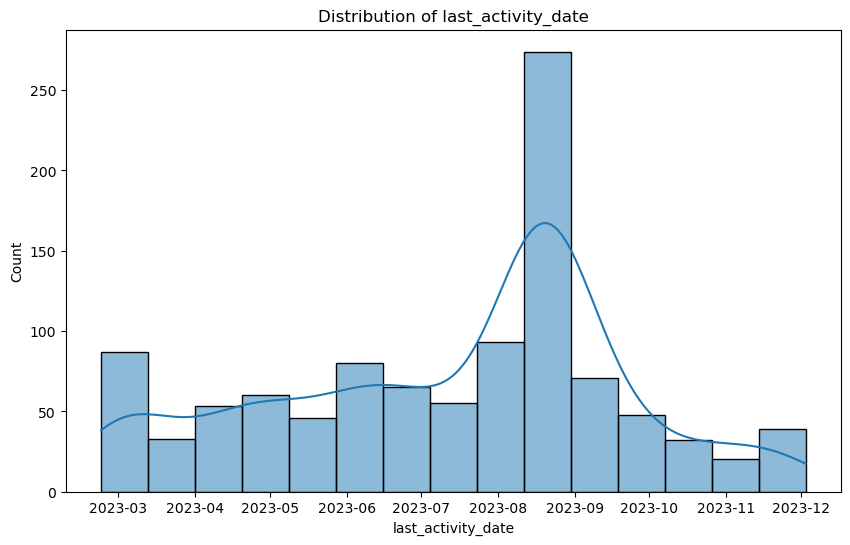

In [2]:
# plot df['last_activity_date']
plt.figure(figsize=(10, 6))
sns.histplot(df['last_activity_date'], kde=True)
plt.title('Distribution of last_activity_date')
plt.show()

In [3]:
# Load the data dictionary
data_dictionary_uni = pd.read_excel('data/Nearpeer Data Roux Analytics Class 040524.2 confidential.xlsx', sheet_name='Data dictionary - university', header=1).clean_names()

print('Data dictionary for the university data:\n')
for column in data_dictionary_uni.columns:
    print(f'{column}: {data_dictionary_uni[column].values[0]}')

data_dictionary_np = pd.read_excel('data/Nearpeer Data Roux Analytics Class 040524.2 confidential.xlsx', sheet_name='Data dictionary - Nearpeer', header=7).clean_names()

print('\n\nData dictionary for the Nearpeer data:\n')
for column in data_dictionary_np.columns:
    print(f'{column}: {data_dictionary_np[column].values[0]}')

data_dictionary_np

Data dictionary for the university data:

unnamed_0: nan
roux_class_record_id: Random ID to match back to student ID
admitted_y_n: Y = Student applied and was offered admission to this university
committed_y_n: Y = Admitted student accepted their offer of admission for Fall 2023
enrolled_at_census_y_n: Y = As of about 3 weeks into Fall 2023 term, student remained enrolled as an active student
most_recent_status: Matriculation = student remains currently enrolled as of this data export
nearpeer_user_: Yes = student did create a Nearpeer profile
nearpeer_user_id: Unique Nearpeer ID associated with that student who created a Nearpeer profile. Use to look up that student's Nearpeer profile info on the Nearpeer User data tab.
application_student_type: Either Freshman or Transfer (from another college/university)
deposit_date: Date/time the university recorded that the student accepted their offer of admission
orientation_attendance_y_n: Y = student attended new student orientation
country: 

,user_id,nearpeer_user_,school_number,badge,enabled,verified_email,profile_created,age,major,career_aspiration,...,i_invited_but_they_have_not_responded_yet,i_ignored_or_disconnected_from_them,they_invited_and_i_accepted,they_invited_but_i_have_not_responded_yet,they_disconnected_from_me,chats_sent,chats_received,chats_total,groups_posted_to,sessions
0,Unique Nearpeer ID associated with that studen...,All in the list are Nearpeer users so Yes appl...,ignore,Represents the role of the user,Yes = user remains enabled. No = user account ...,"In profile creation process, user verified the...",NaN,Self-reported approximate age by student,Self-reported by student from dropdown list,Self-reported by student as open text field,...,User connection requests made by this user and...,Number of User connection requests made by OTH...,Connection requests received by this user that...,Connection requests received by this user that...,Connections this user had where the other pers...,1:1 chat messages sent by user,1:1 chat messages received,Total chats sent/received,Number of group chats this user has made a pos...,Number of user session of this user


In [4]:
df.head()

,roux_class_record_id,admitted,committed,enrolled,most_recent_status,nearpeer_user_x,user_id,application_student_type,deposit_date,orientation_attendance,...,they_invited_and_i_accepted,they_invited_but_i_have_not_responded_yet,they_disconnected_from_me,chats_sent,chats_received,chats_total,groups_posted_to,sessions,days_from_deposit_to_sep_1,days_from_last_activity_to_sep_1
0,30,Y,Y,Y,Matriculation,Yes,208651,Freshman,03-27,Y,...,4,1,0,37,29,66,<NA>,37,-208.0,-86
1,39,Y,Y,Y,Matriculation,Yes,208643,Freshman,01-22,Y,...,19,2,0,10,21,31,<NA>,43,-143.0,-32
2,95,Y,Y,Y,Matriculation,Yes,208584,Freshman,01-19,Y,...,0,3,0,<NA>,<NA>,<NA>,<NA>,1,-140.0,176
3,99,Y,Y,Y,Matriculation,Yes,208578,Freshman,04-02,Y,...,0,1,0,<NA>,<NA>,<NA>,<NA>,1,-214.0,176
4,127,Y,Y,Y,Matriculation,Yes,208554,Freshman,01-28,Y,...,5,1,0,11,14,25,<NA>,41,-149.0,10


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1056 entries, 0 to 1055
Data columns (total 65 columns):
 #   Column                                     Non-Null Count  Dtype              
---  ------                                     --------------  -----              
 0   roux_class_record_id                       1056 non-null   Int64              
 1   admitted                                   1056 non-null   object             
 2   committed                                  1056 non-null   object             
 3   enrolled                                   1056 non-null   object             
 4   most_recent_status                         1056 non-null   object             
 5   nearpeer_user_x                            1056 non-null   object             
 6   user_id                                    1056 non-null   Int64              
 7   application_student_type                   1056 non-null   object             
 8   deposit_date                               1000 

In [6]:
print(f'University data shape: {uni_data.shape}')
print(f'Nearpeer data shape: {np_data.shape}')
print(f'Merged data shape: {df.shape}')

University data shape: (21687, 16)
Nearpeer data shape: (1727, 49)
Merged data shape: (1056, 65)


In [7]:
# Write the cleaned data to a csv
df.to_csv('data/aly_6080_nearpeer_cleaned_data.csv', index=False)

### Notes

In [8]:
###################################################################################

# 4/22/2024 notes
# GROUP PROJECT: teams will actually solve the problem together

# Preprocess the data
# Check for missing values

# Each group should look into the three problems from Slide 11 of the presentation
# Based on what we find, individual team members can create different models 
# Each group has a leader who's taken ALY 6020/6040 who can help guide the predictive modeling process
# Other team members can focus on the EDA, statistical analysis, and data visualization, etc.

# Create null hypothesis and alternative hypothesis for this week's discussion

# Example hypthothesis: 95% of students who use Nearpeer will enroll...

# In-class work with team:
# 1. H1: There is a difference in matriculation rates across majors. H0: There is no difference in matriculation rates across majors.
# 2. H1: Matriculation rate is higher for Nearpeer users than non-users. H0: Matriculation rate is the same for Nearpeer users and non-users.
# 3. H1: Nearpeer users who are open to social connections are more likely to matriculate. H0: Nearpeer users who are open to social connections are not more likely to matriculate.
# 4. TBD

# INDIVIDUAL PROJECT: I won't actually solve the problem, but I will propose one and walk through the process of solving it.
# Pick a separate problem you might have data for or not (hypothetical data),

#################################################################################

# 4/29/2024
# Group presentations on initial hypotheses

# For next week, have one slide about the challenges and questions about the data.

#################################################################################

# 5/13/2024
# Individual project: Write a report on the hypthetical data needed for a hypothetical additional problem, the methodology, and what the results might look like.

# 1. Plan
# 2. Presentation
# 3. Who is presenting?

#################################################################################

# 5/25/2024
# Thoughts about our group assignment due tomorrow

# Tables
# 1. Missingness
# 2. Summary statistics
# 3. Correlation matrix
# 4. Correlations (strong and moderate)
# 5. t-statistics
# 6. Model results
# 7. Model comparison

#################################################################################

# 6/3/2024
# Data governance
# Umesh expects us to publish to GitHub/Discovery?






In [9]:
# Classify majors into more general categories
major_categories = {
    'Biology': 'Life Sciences',
    'Film & Media Arts': 'Arts & Humanities',
    'Biochemistry': 'Life Sciences',
    'Theatre BFA': 'Arts & Humanities',
    'Business Administration': 'Business & Management',
    'Mechanical Engineering': 'Engineering',
    'Information Systems': 'Computer Science & IT',
    'Design': 'Arts & Humanities',
    'Health and Kinesiology': 'Health & Medicine',
    'Art BFA': 'Arts & Humanities',
    'Nursing': 'Health & Medicine',
    'Undecided': 'Other',
    'Computer Science': 'Computer Science & IT',
    'English': 'Arts & Humanities',
    'Psychology': 'Social Sciences',
    'Ballet BFA': 'Arts & Humanities',
    'Medical Laboratory Science': 'Health & Medicine',
    'Chemistry': 'Physical Sciences',
    'Civil & Environmental Engineering': 'Engineering',
    'Economics': 'Social Sciences',
    'Biomedical Engineering': 'Engineering',
    'Data Science': 'Computer Science & IT',
    'Graphic Design': 'Arts & Humanities',
    'International Studies': 'Social Sciences',
    'Chemical Engineering': 'Engineering',
    'Finance': 'Business & Management',
    'Architectural Studies': 'Arts & Humanities',
    'Political Science': 'Social Sciences',
    'Modern Dance BFA': 'Arts & Humanities',
    'Linguistics': 'Arts & Humanities',
    'Writing and Rhetoric Studies': 'Arts & Humanities',
    'History': 'Social Sciences',
    'Environmental & Sustainability Studies': 'Social Sciences',
    'Criminology': 'Social Sciences',
    'Entrepreneurship': 'Business & Management',
    'Management': 'Business & Management',
    'Social Work BSW': 'Social Sciences',
    'Games': 'Computer Science & IT',
    'Elementary Education': 'Education',
    'Music': 'Arts & Humanities',
    'Computer Engineering': 'Engineering',
    'Electrical Engineering': 'Engineering',
    'Sociology': 'Social Sciences',
    'Accounting': 'Business & Management',
    'Speech & Hearing Science': 'Health & Medicine',
    'Physics': 'Physical Sciences',
    'Marketing': 'Business & Management',
    'Quantitative Analysis of Markets & Organizations': 'Business & Management',
    'Secondary Education': 'Education',
    'Anthropology': 'Social Sciences',
    'Music BMus': 'Arts & Humanities',
    'Special Education': 'Education',
    'Theatre': 'Arts & Humanities',
    'Mathematics': 'Mathematics & Statistics',
    'Communication': 'Social Sciences',
    'Art History': 'Arts & Humanities',
    'Parks, Recreation & Tourism': 'Social Sciences',
    'Operations and Supply Chain': 'Business & Management',
    'Family, Community & Human Development': 'Social Sciences',
    'Chinese': 'Language & Linguistics',
    'Atmospheric Sciences': 'Physical Sciences',
    'English Teaching': 'Education',
    'Applied Mathematics': 'Mathematics & Statistics',
    'Spanish': 'Language & Linguistics',
    'Classics': 'Arts & Humanities',
    'Materials Science & Engineering': 'Engineering',
    'Health Society & Policy': 'Health & Medicine',
    'Urban Ecology': 'Environmental Sciences',
    'Theatre Teaching': 'Education',
    'Religious Studies': 'Arts & Humanities',
    'Educational Psychology': 'Education',
    'Geoscience': 'Physical Sciences',
    'Undeclared': 'Other',
    'Pre Film and Media Arts BA': 'Arts & Humanities',
    'Undeclared Pre Dentistry BS': 'Health & Medicine',
    'Pre Theatre BFA': 'Arts & Humanities',
    'Pre Business BA': 'Business & Management',
    'Pre Mechanical Engeering BS': 'Engineering',
    'Pre Business BS': 'Business & Management',
    'Pre Design BS': 'Arts & Humanities',
    'Pre Health and Kinesiology BS': 'Health & Medicine',
    'Pre Art BFA': 'Arts & Humanities',
    'Pre Family Community & Human Development BS': 'Social Sciences',
    'Undeclared Pre Medicine BS': 'Health & Medicine',
    'Pre Construction Engineering BS': 'Engineering',
    'Pre Psychology BS': 'Social Sciences',
    'Pre Medical Lab Science BS': 'Health & Medicine',
    'Pre Computer Science BS': 'Computer Science & IT',
    'Pre Nursing BS': 'Health & Medicine',
    'Pre Ballet BFA': 'Arts & Humanities',
    'Pre Biology BS': 'Life Sciences',
    'Pre Chemistry BA': 'Physical Sciences',
    'Pre Civil Engineering BS': 'Engineering',
    'Pre Economics BS': 'Social Sciences',
    'Pre Biomedical Engineering BS': 'Engineering',
    'Pre Psychology BA': 'Social Sciences',
    'Pre Games BS': 'Computer Science & IT',
    'Pre Communication BA': 'Social Sciences',
    'Pre International Studies BA': 'Social Sciences',
    'Pre Computer Engineering BS': 'Engineering',
    'Pre Chemical Engineering BS': 'Engineering',
    'Pre Mathematics BS': 'Mathematics & Statistics',
    'Pre Environmental & Sustainability Studies BS': 'Social Sciences',
    'Pre Sociology BA': 'Social Sciences',
    'Pre Economics BA': 'Social Sciences',
    'Pre Biochemistry BS': 'Life Sciences',
    'Pre Engineering BS': 'Engineering',
    'Pre Architectural Studies BS': 'Arts & Humanities',
    'Pre Modern Dance BFA': 'Arts & Humanities',
    'Pre Linguistics BA': 'Arts & Humanities',
    'Pre Writing & Rhetoric Studies BA': 'Arts & Humanities',
    'Pre Political Science BA': 'Social Sciences',
    'Pre Chemistry BS': 'Physical Sciences',
    'Undeclared Pre Pharmacy BS': 'Health & Medicine',
    'Pre History BA': 'Social Sciences',
    'Pre Criminology BA': 'Social Sciences',
    'Pre Criminology BS': 'Social Sciences',
    'Pre Political Science BS': 'Social Sciences',
    'Pre Social Work BSW': 'Social Sciences',
    'Undeclared Pre Medicine BA': 'Health & Medicine',
    'Undeclared Pre Law BS': 'Law & Legal Studies',
    'Pre Education BA': 'Education',
    'Pre Special Education BS': 'Education',
    'Pre Music BA': 'Arts & Humanities',
    'Undeclared Pre Law BA': 'Law & Legal Studies',
    'Pre Electrical Engineering BS': 'Engineering',
    'Pre German BA': 'Language & Linguistics',
    'Pre Art History BA': 'Arts & Humanities',
    'Pre Speech & Hearing Science BS': 'Health & Medicine',
    'Pre Physics BS': 'Physical Sciences',
    'Pre Environmental & Sustainability Studies BA': 'Social Sciences',
    'Pre International Studies BS': 'Social Sciences',
    'Pre Metallurgical Engeering BS': 'Engineering',
    'Undeclared Pre Dentistry BA': 'Health & Medicine',
    'Pre Anthropology BS': 'Social Sciences',
    'Pre Biology BA': 'Life Sciences',
    'Pre Music BMU': 'Arts & Humanities',
    'Pre Data Science BS': 'Computer Science & IT',
    'Pre Geoscience BSG': 'Physical Sciences',
    'Pre Education BS': 'Education',
    'Pre Biochemistry BA': 'Life Sciences',
    'Pre Parks Recreation & Tourism BA': 'Social Sciences',
    'Pre Communication BS': 'Social Sciences',
    'Pre Health, Society & Policy BS': 'Health & Medicine',
    'Pre Philosophy BA': 'Arts & Humanities',
    'Pre Speech & Hearing Science BA': 'Health & Medicine',
    'Pre English BA': 'Arts & Humanities',
    'Pre Chinese BA': 'Language & Linguistics',
    'Pre Atmospheric Sciences BS': 'Physical Sciences',
    'Pre Educational Psychology BA': 'Education',
    'Pre Graphic Design': 'Arts & Humanities',
    'Pre Spanish BA': 'Language & Linguistics',
    'Pre Classics BA': 'Arts & Humanities',
    'Pre Material Science & Engineering BS': 'Engineering',
    'Pre Parks Recreation & Tourism BS': 'Social Sciences',
    'Pre Applied Mathematics BS': 'Mathematics & Statistics',
    'Pre Anthropology BA': 'Social Sciences',
    'Pre Geography BS': 'Social Sciences',
    'Pre Family Community & Human Development BA': 'Social Sciences',
    'Pre Theatre BA': 'Arts & Humanities',
    'Pre Sociology BS': 'Social Sciences',
    'Pre Educational Psychology BS': 'Education'
}

# Function to categorize majors
def categorize_major(major):
    return major_categories.get(major, 'Other')

# Apply the function to create a new column with the major categories
df['major_category_x'] = df['major_x'].apply(categorize_major)
df['major_category_y'] = df['major_y'].apply(categorize_major)

# Add column for whether the major categories match
df['major_categories_match'] = df['major_category_x'] == df['major_category_y']

# Drop the 'major_x' and 'major_y' columns
df = df.drop(columns=['major_x', 'major_y'])

In [10]:
# Add a column for 'career_aspiration_character_count'
df['career_aspiration_character_count'] = df['career_aspiration'].str.len()

# Drop the 'career_aspiration' column
df = df.drop(columns='career_aspiration')

In [11]:
# Recategorize gender to fewer categories
df.gender.unique().tolist()

gender_categories = {
    'Female': ['Female', 'She/they', 'She/They', 'She/they/he', 'He/She'],
    'Male': ['Male', 'He/him/they/them', 'He/they', 'He/They'],
    'Decline': ['Decline', '?\\_(?)_/?'],
    'Other': ['Nonbinary', 'USA', 'He/him/They/them', 'Hamburger/Texan']
}

# Function to categorize gender
def categorize_gender(gender):
    for category, values in gender_categories.items():
        if gender in values:
            return category
    return 'Other'

# Iterate over the 'gender' column in df and apply the function
df['gender'] = df['gender'].apply(categorize_gender)


In [12]:
# Recategorize race to fewer categories
df.race.unique().tolist()

race_categories = {
    'White': ['White'],
    'Asian': ['Asian', 'Asian, White', 'Asian, Black or African American, Native Hawaiian or Other Pacific Islander', 
              'Asian, Native Hawaiian or Other Pacific Islander, White', 'American Indian or Alaska Native, Asian, Native Hawaiian or Other Pacific Islander'],
    'Black or African American': ['Black or African American', 'Black or African American, White',
                                  'American Indian or Alaska Native, Black or African American, White'],
    'Native Hawaiian or Other Pacific Islander': ['Native Hawaiian or Other Pacific Islander',
                                                  'Native Hawaiian or Other Pacific Islander, White'],
    'American Indian or Alaska Native': ['American Indian or Alaska Native',
                                         'American Indian or Alaska Native, White']
}

# Function to categorize race
def categorize_race(race):
    for category, values in race_categories.items():
        if race in values:
            return category
    return 'Other'

df['race'] = df['race'].apply(categorize_race)


## EDA



In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1056 entries, 0 to 1055
Data columns (total 66 columns):
 #   Column                                     Non-Null Count  Dtype              
---  ------                                     --------------  -----              
 0   roux_class_record_id                       1056 non-null   Int64              
 1   admitted                                   1056 non-null   object             
 2   committed                                  1056 non-null   object             
 3   enrolled                                   1056 non-null   object             
 4   most_recent_status                         1056 non-null   object             
 5   nearpeer_user_x                            1056 non-null   object             
 6   user_id                                    1056 non-null   Int64              
 7   application_student_type                   1056 non-null   object             
 8   deposit_date                               1000 

In [14]:
# Set the style of the plots
sns.set_style('whitegrid')

# Set the palette for the plots
sns.set_palette('Set2')

# Set the default figure size globally
mpl.rcParams['figure.figsize'] = (10, 6)

# Set global plotting parameters
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
plt.rcParams['legend.fontsize'] = 12
plt.rcParams['axes.titlelocation'] = 'left'

### Assessing missingness

In [15]:
# Find the percentage of missing values in each column
missing_values = df.isnull().mean() * 100

# Change pandas setting to display all rows
pd.set_option('display.max_rows', None)

# Show this in a dataframe
missing_df = pd.DataFrame(missing_values).reset_index()
missing_df.columns = ['column', 'missing_percentage']
missing_df.sort_values(by='missing_percentage', ascending=False, inplace=True)
missing_df.reset_index(drop=True, inplace=True)
missing_df.head(100)


,column,missing_percentage
0,bio_[deleted_for_privacy],100.000000
1,first_invitation_date,99.621212
2,invitations,99.621212
3,groups_posted_to,85.416667
4,passions,72.821970
5,chats_sent,56.534091
6,chats_received,56.534091
7,chats_total,56.534091
8,last_group_message,49.621212
9,hispanic_ethnicity,44.507576


### Descriptive statistics

In [16]:
# Create descriptive statistics table
desc_stats = df.describe(include=[float, int]).T
desc_stats = desc_stats.reset_index()
desc_stats = desc_stats.rename(columns={'index': 'column'})
median_stats = df.select_dtypes(include=[float, int]).median().reset_index()
median_stats.columns = ['column', 'median']
desc_stats = pd.merge(desc_stats, median_stats, on='column', how='left')
desc_stats[['count', 'mean', 'median', 'std', 'min', '25%', '50%', '75%', 'max']] = desc_stats[['count', 'mean', 'median', 'std', 'min', '25%', '50%', '75%', 'max']].round(2)
desc_stats = desc_stats[['column', 'count', 'mean', 'median', 'std', 'min', '25%', '50%', '75%', 'max']]
desc_stats

,column,count,mean,median,std,min,25%,50%,75%,max
0,roux_class_record_id,1056.0,11429.595644,11209.5,6919.922682,30.0,5359.25,11209.5,17282.25,24078.0
1,user_id,1056.0,221270.378788,217265.5,52057.527234,208310.0,212420.75,217265.5,222436.25,980841.0
2,age,1056.0,18.028409,18.0,1.491571,15.0,17.0,18.0,18.0,42.0
3,bio_[deleted_for_privacy],0.0,NaN,<NA>,NaN,NaN,NaN,NaN,NaN,NaN
4,bio_character_count,1056.0,55.091856,28.5,60.799913,0.0,0.0,28.5,115.0,165.0
5,interests_count,1056.0,20.52178,11.0,27.474892,1.0,5.0,11.0,24.0,200.0
6,groups_count,1056.0,1.136364,1.0,1.369389,0.0,0.0,1.0,2.0,32.0
7,number_of_peers,1056.0,10.71875,2.0,18.674043,0.0,0.0,2.0,13.0,149.0
8,graduating_class,902.0,2026.640798,2027.0,1.029864,2023.0,2027.0,2027.0,2027.0,2029.0
9,invitations,4.0,2.25,2.0,1.258306,1.0,1.75,2.0,2.5,4.0


In [17]:
# Create two descriptive statistics tables for the two groups, enrolled and not enrolled using the same method as above
desc_stats_enrolled = df[df['enrolled'] == 'Y'].describe(include=[float, int]).T
desc_stats_enrolled = desc_stats_enrolled.reset_index()
desc_stats_enrolled = desc_stats_enrolled.rename(columns={'index': 'column'})
median_stats_enrolled = df[df['enrolled'] == 'Y'].select_dtypes(include=[float, int]).median().reset_index()
median_stats_enrolled.columns = ['column', 'median']
desc_stats_enrolled = pd.merge(desc_stats_enrolled, median_stats_enrolled, on='column', how='left')
desc_stats_enrolled[['count', 'mean', 'median', 'std', 'min', '25%', '50%', '75%', 'max']] = desc_stats_enrolled[['count', 'mean', 'median', 'std', 'min', '25%', '50%', '75%', 'max']].round(2)
desc_stats_enrolled = desc_stats_enrolled[['column', 'count', 'mean', 'median', 'std', 'min', '25%', '50%', '75%', 'max']]
desc_stats_enrolled


,column,count,mean,median,std,min,25%,50%,75%,max
0,roux_class_record_id,925.0,11451.367568,11214.0,6958.381357,30.0,5312.0,11214.0,17374.0,24078.0
1,user_id,925.0,221870.792432,217311.0,55563.486307,208310.0,212473.0,217311.0,222449.0,980841.0
2,age,925.0,18.036757,18.0,1.534153,15.0,18.0,18.0,18.0,42.0
3,bio_[deleted_for_privacy],0.0,NaN,<NA>,NaN,NaN,NaN,NaN,NaN,NaN
4,bio_character_count,925.0,57.607568,33.0,61.165365,0.0,0.0,33.0,118.0,164.0
5,interests_count,925.0,21.298378,12.0,27.991063,1.0,5.0,12.0,25.0,200.0
6,groups_count,925.0,1.151351,1.0,1.394489,0.0,0.0,1.0,2.0,32.0
7,number_of_peers,925.0,11.154595,2.0,19.299219,0.0,0.0,2.0,14.0,149.0
8,graduating_class,792.0,2026.661616,2027.0,1.002723,2023.0,2027.0,2027.0,2027.0,2029.0
9,invitations,4.0,2.25,2.0,1.258306,1.0,1.75,2.0,2.5,4.0


In [18]:
# Create descriptive statistics table for the group of students who did not enroll
desc_stats_not_enrolled = df[df['enrolled'] == 'N'].describe(include=[float, int]).T
desc_stats_not_enrolled = desc_stats_not_enrolled.reset_index()
desc_stats_not_enrolled = desc_stats_not_enrolled.rename(columns={'index': 'column'})
median_stats_not_enrolled = df[df['enrolled'] == 'N'].select_dtypes(include=[float, int]).median().reset_index()
median_stats_not_enrolled.columns = ['column', 'median']
desc_stats_not_enrolled = pd.merge(desc_stats_not_enrolled, median_stats_not_enrolled, on='column', how='left')
desc_stats_not_enrolled[['count', 'mean', 'median', 'std', 'min', '25%', '50%', '75%', 'max']] = desc_stats_not_enrolled[['count', 'mean', 'median', 'std', 'min', '25%', '50%', '75%', 'max']].round(2)
desc_stats_not_enrolled = desc_stats_not_enrolled[['column', 'count', 'mean', 'median', 'std', 'min', '25%', '50%', '75%', 'max']]
desc_stats_not_enrolled

,column,count,mean,median,std,min,25%,50%,75%,max
0,roux_class_record_id,131.0,11275.862595,11093.0,6665.794934,254.0,6035.0,11093.0,16873.0,23327.0
1,user_id,131.0,217030.816794,217016.0,5321.370111,208363.0,212060.5,217016.0,221474.0,226632.0
2,age,131.0,17.969466,18.0,1.149842,17.0,17.0,18.0,18.0,24.0
3,bio_[deleted_for_privacy],0.0,NaN,<NA>,NaN,NaN,NaN,NaN,NaN,NaN
4,bio_character_count,131.0,37.328244,0.0,55.183811,0.0,0.0,0.0,70.0,165.0
5,interests_count,131.0,15.038168,7.0,22.860246,1.0,4.0,7.0,17.0,199.0
6,groups_count,131.0,1.030534,1.0,1.176298,0.0,0.0,1.0,2.0,6.0
7,number_of_peers,131.0,7.641221,1.0,13.106116,0.0,0.0,1.0,8.5,69.0
8,graduating_class,110.0,2026.490909,2027.0,1.202028,2023.0,2027.0,2027.0,2027.0,2028.0
9,invitations,0.0,NaN,<NA>,NaN,NaN,NaN,NaN,NaN,NaN


### Frequency tables/plots

In [19]:
# Loop through all categorical columns and create frequency tables
categorical_cols = df.select_dtypes(include='object').columns

# Remove 'interests' 'passions' 'groups' from the list of categorical columns
categorical_cols = [col for col in categorical_cols if col not in ['interests', 'passions', 'groups']]

for col in categorical_cols:
    freq_table = df[col].value_counts(normalize=True) * 100
    freq_table = freq_table.reset_index()
    freq_table.columns = [col, 'percentage']
    print(f'Frequency table for {col}')
    print(freq_table)
    print('\n')

Frequency table for admitted
  admitted  percentage
0        Y       100.0


Frequency table for committed
  committed  percentage
0         Y    91.57197
1         N     8.42803


Frequency table for enrolled
  enrolled  percentage
0        Y   87.594697
1        N   12.405303


Frequency table for most_recent_status
  most_recent_status  percentage
0      Matriculation   92.613636
1              Admit    7.386364


Frequency table for nearpeer_user_x
  nearpeer_user_x  percentage
0             Yes       100.0


Frequency table for application_student_type
  application_student_type  percentage
0                 Freshman   90.530303
1                 Transfer    7.575758
2   Freshman International    1.609848
3   Transfer International    0.189394
4              Early Admit    0.094697


Frequency table for deposit_date
    deposit_date  percentage
0          01-12         4.5
1          01-15         3.2
2          01-17         2.5
3          04-02         2.5
4          01-16      

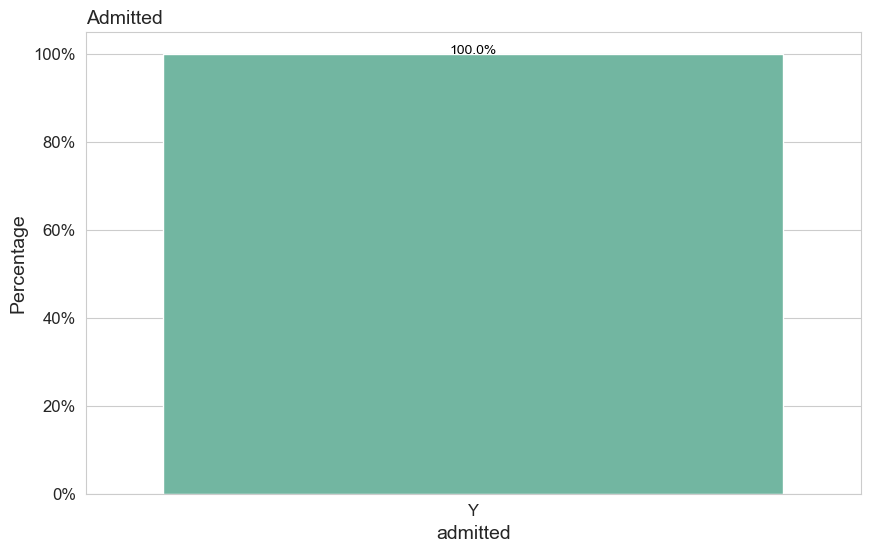

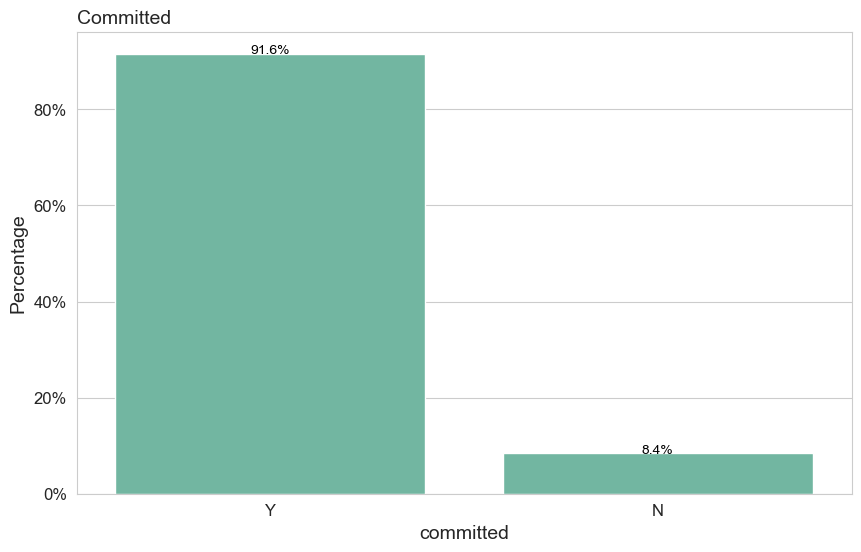

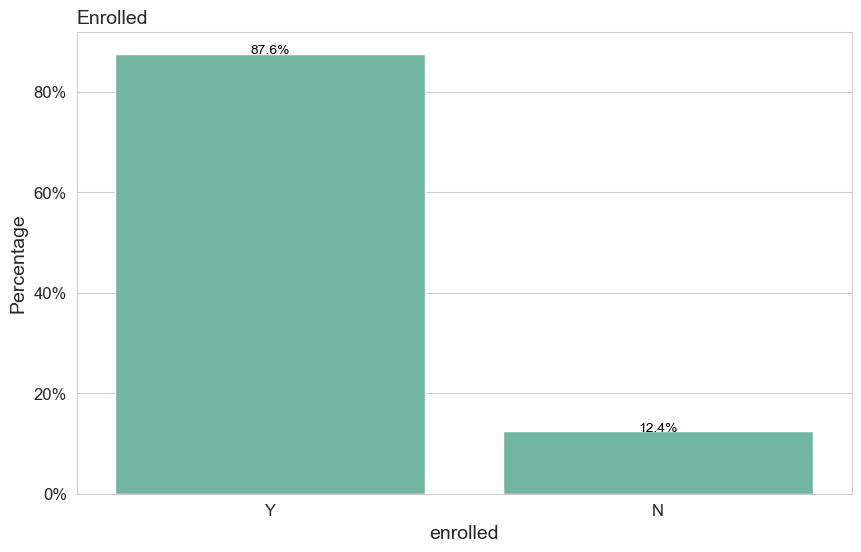

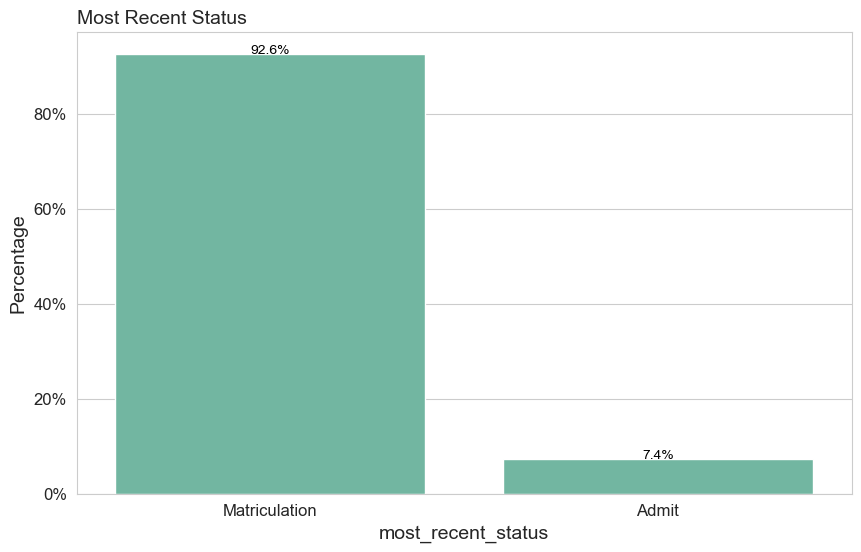

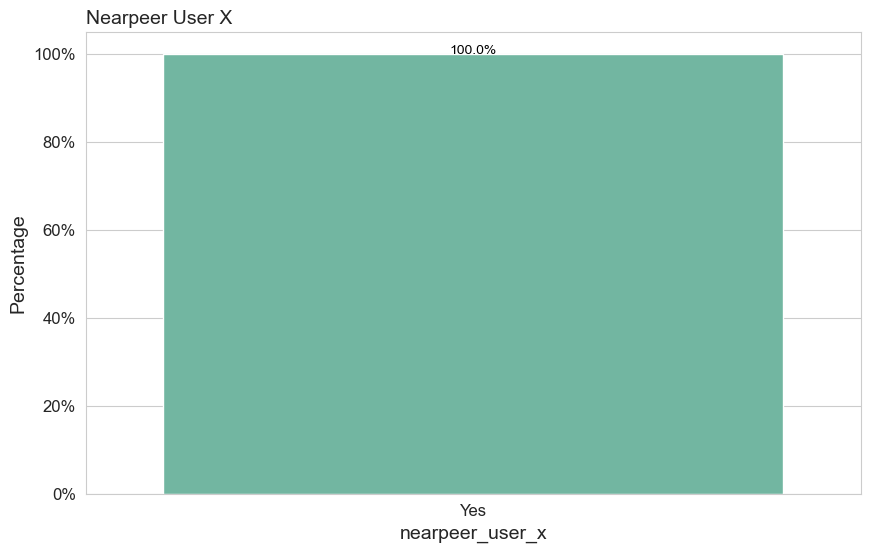

...

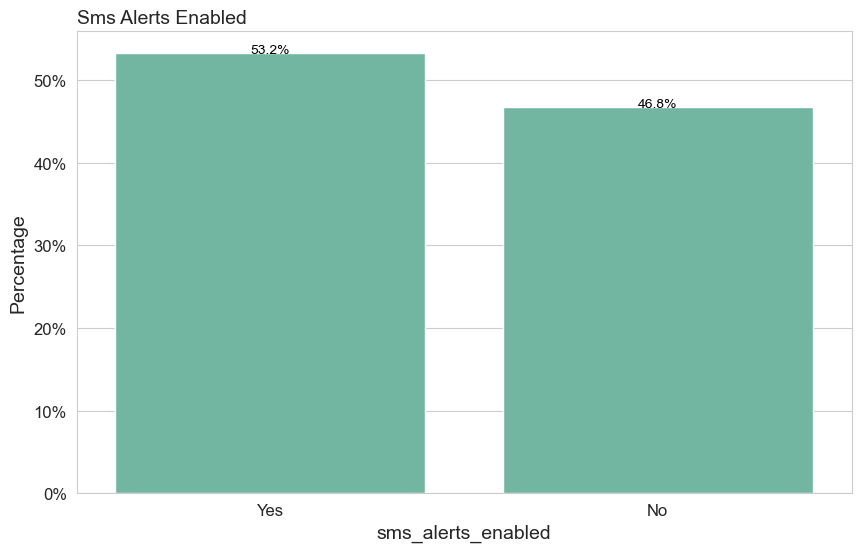

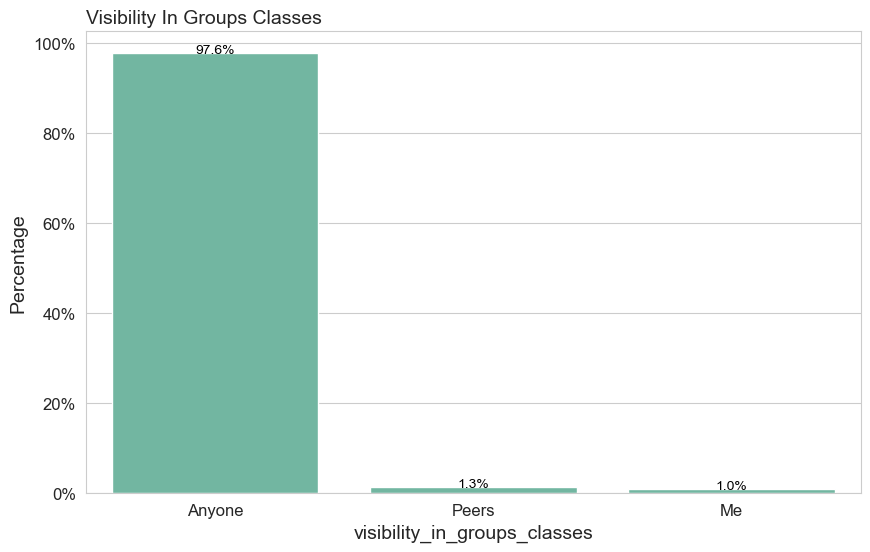

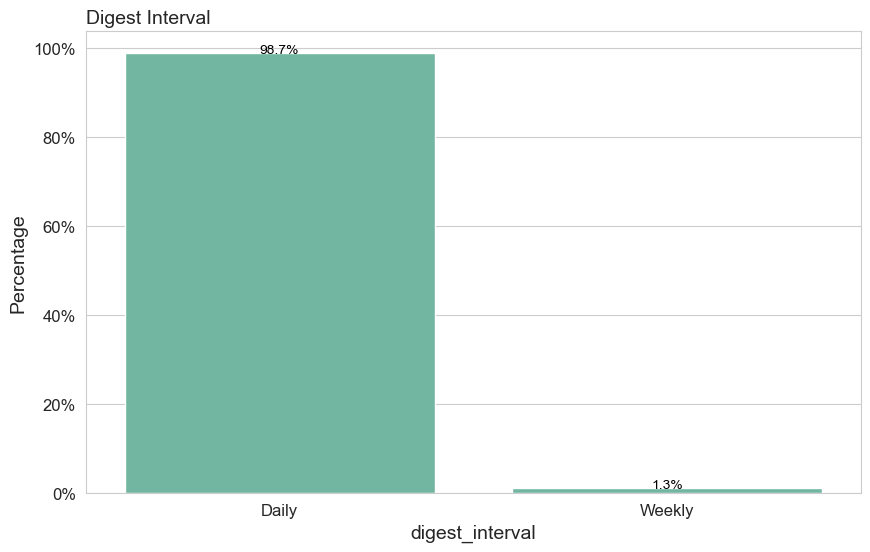

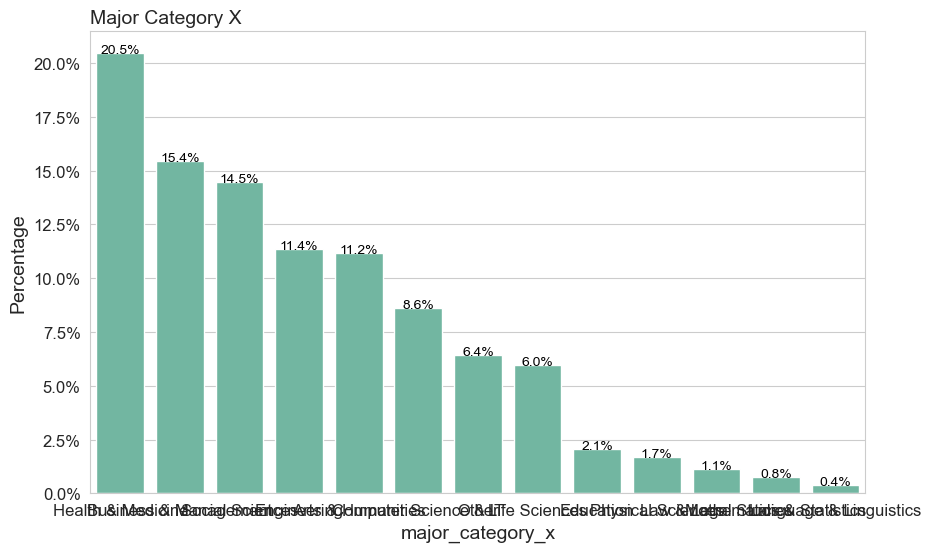

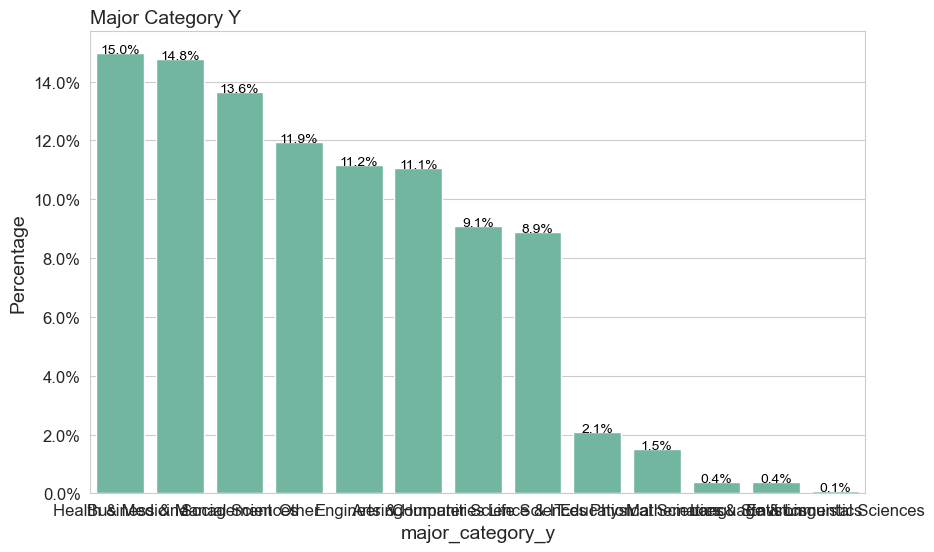

In [20]:
# Plot the frequency of categorical variables as percentages
for col in categorical_cols:
    freq_table = df[col].value_counts(normalize=True) * 100
    freq_table = freq_table.reset_index()
    freq_table.columns = [col, 'percentage']
    plt.figure(figsize=(10, 6))
    sns.barplot(x=col, y='percentage', data=freq_table)
    # Add data labels
    for index, row in freq_table.iterrows():
        plt.text(row.name, row.percentage, f'{row.percentage:.1f}%', color='black', ha='center')
    plt.title(f'Frequency of {col}')
    plt.ylabel('Percentage')
    plt.gca().yaxis.set_major_formatter(mpl.ticker.PercentFormatter())
    plt.title(col.replace('_', ' ').title())
    plt.xticks(rotation=0)
    plt.show()

### Contingency tables

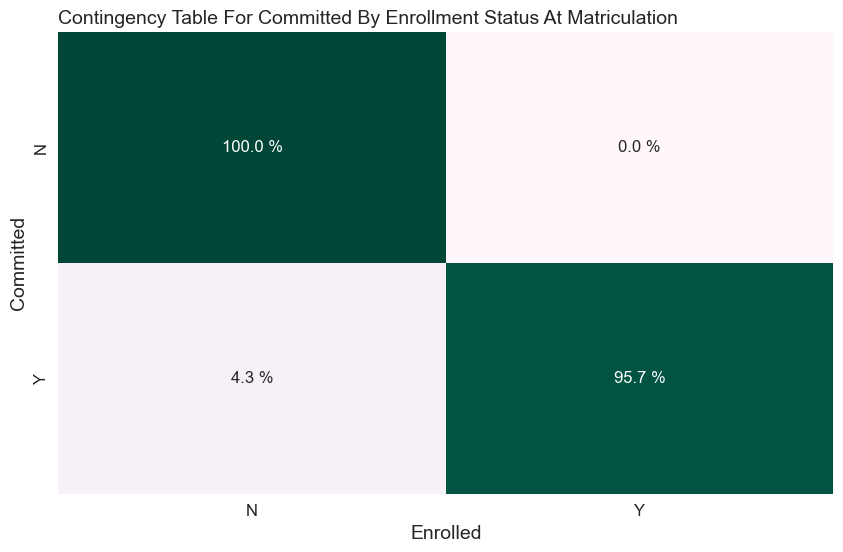

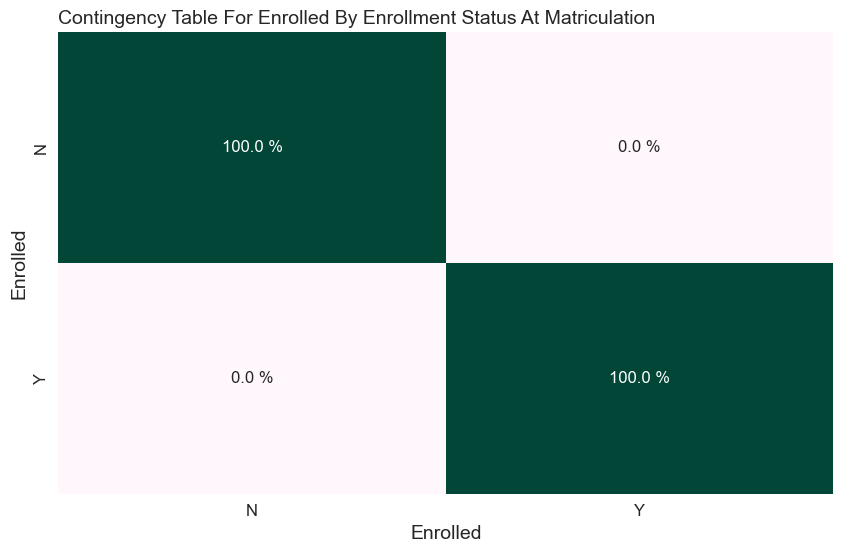

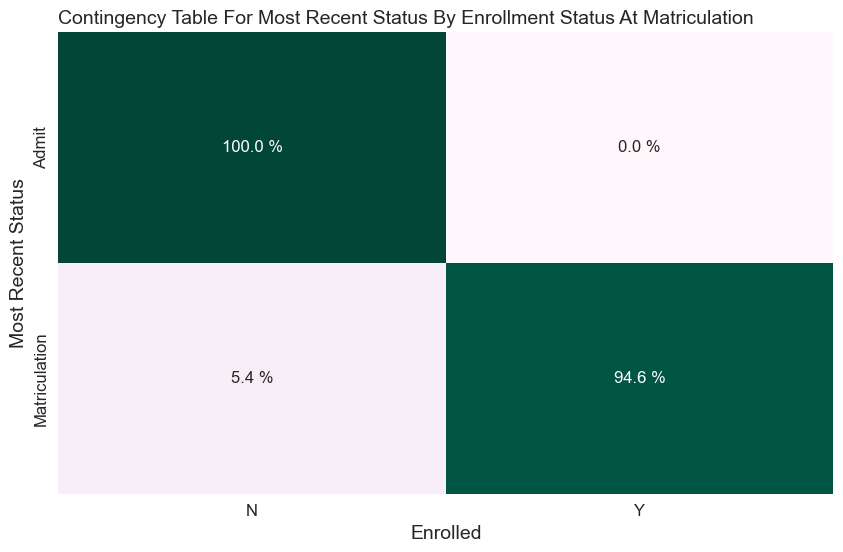

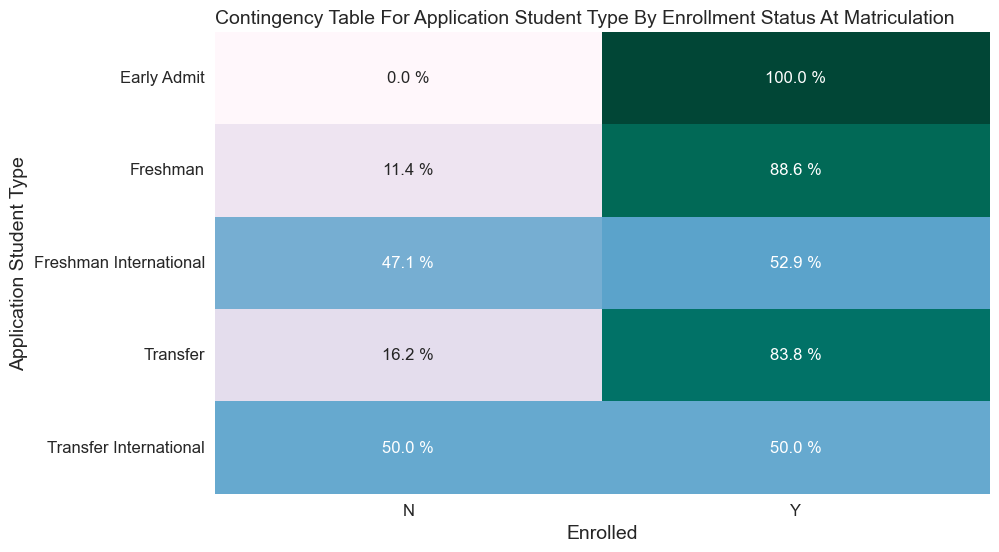

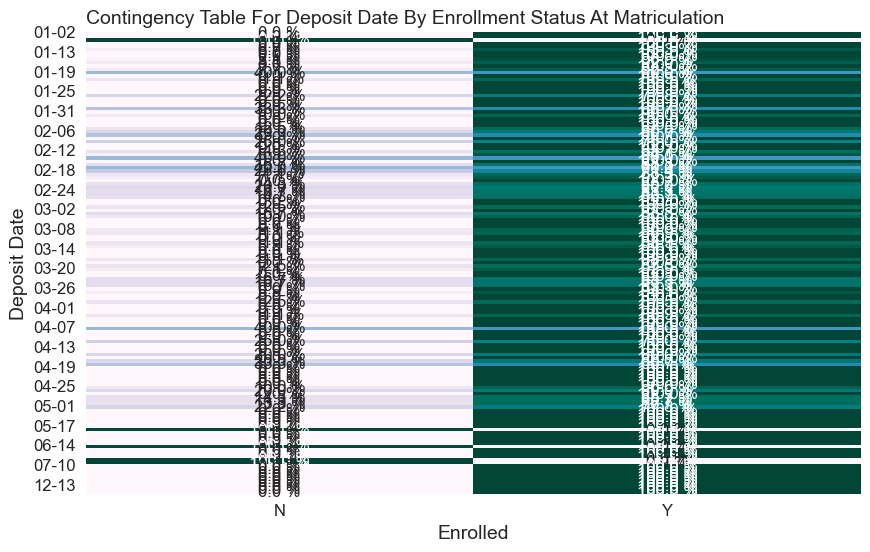

...

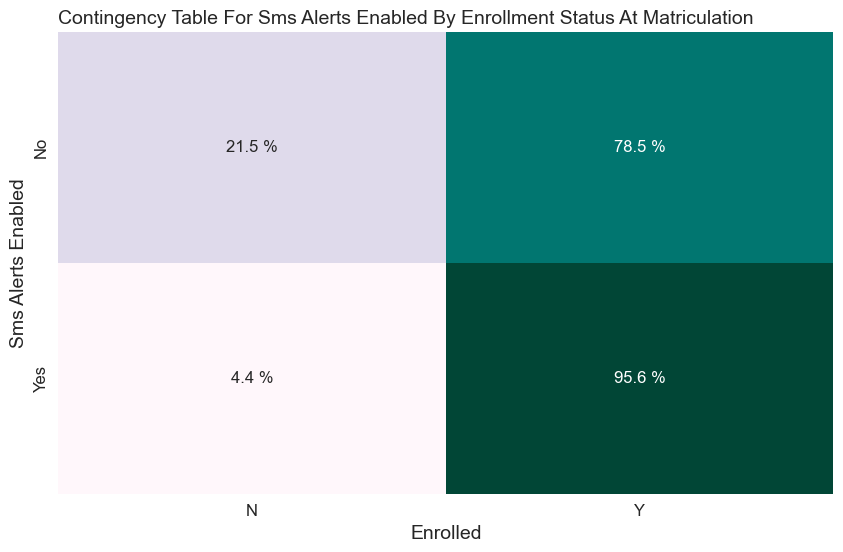

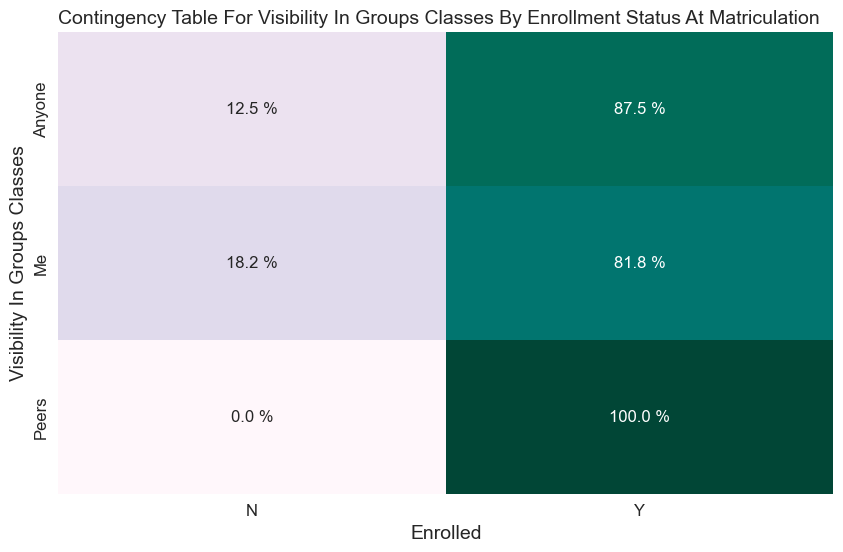

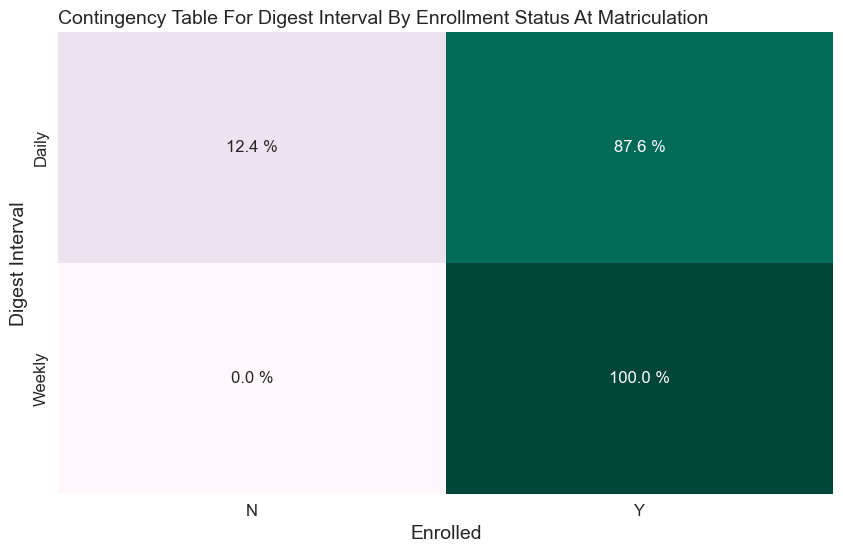

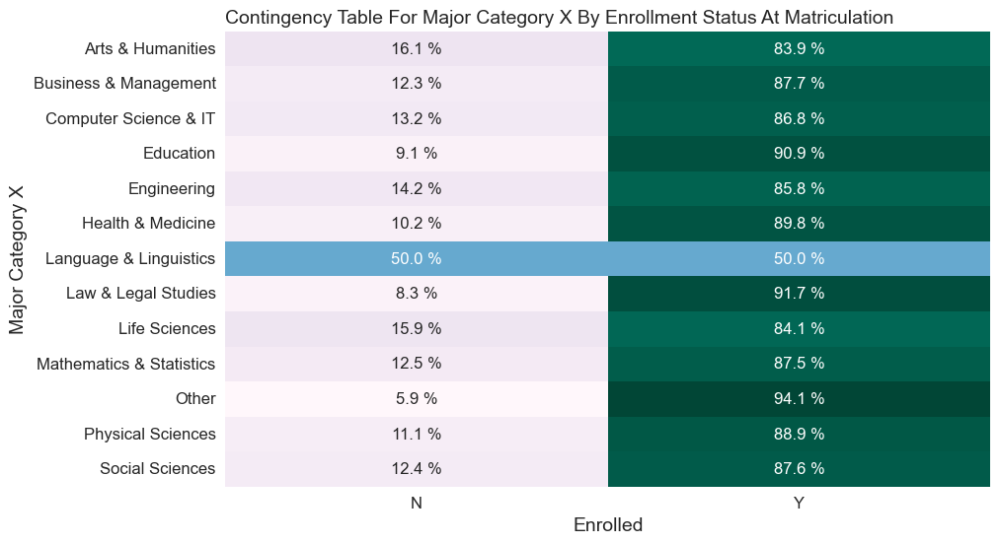

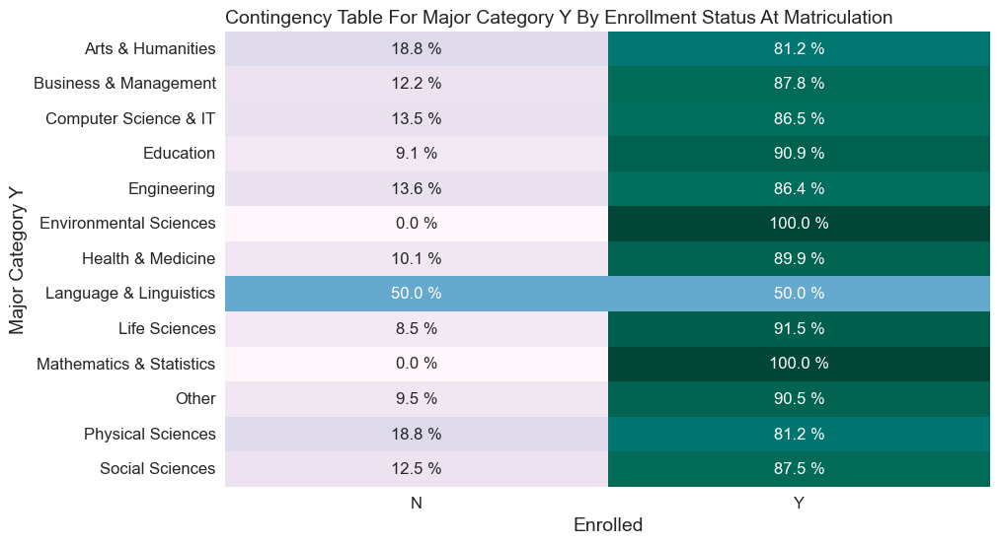

In [21]:
# Plot contingency tables for categorical variables if the column contains at least 2 unique values
for col in categorical_cols:
    if df[col].nunique() > 1:
        contingency_table = pd.crosstab(index=df[col], columns=df['enrolled'], normalize='index') * 100
        plt.figure(figsize=(10, 6))
        ax = sns.heatmap(contingency_table, annot=True, fmt=".1f", cmap='PuBuGn', cbar=False, annot_kws={"size": 12})
        for t in ax.texts: t.set_text(t.get_text() + " %")
        # Format the title as title case and replace underscores with spaces
        plt.title(f'Contingency Table for {col} by Enrollment Status at Matriculation'.title().replace('_', ' '))
        plt.xlabel('Enrolled')
        # Format y label as title case and replace underscores with spaces
        plt.ylabel(f'{col}'.title().replace('_', ' '))
        plt.show()


### Count plots

In [22]:
# Define a custom color palette for 'enrolled' = Y, N
custom_palette = {'Y': 'lightseagreen', 'N': 'orange'}

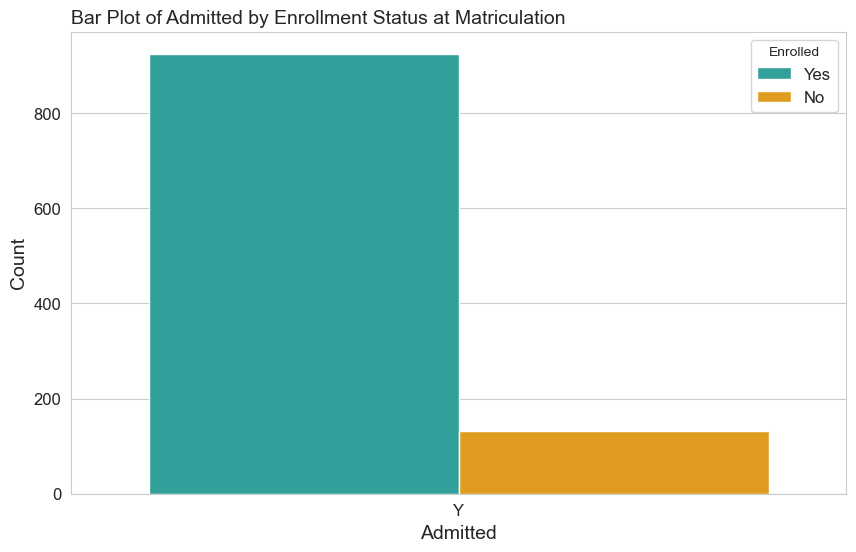

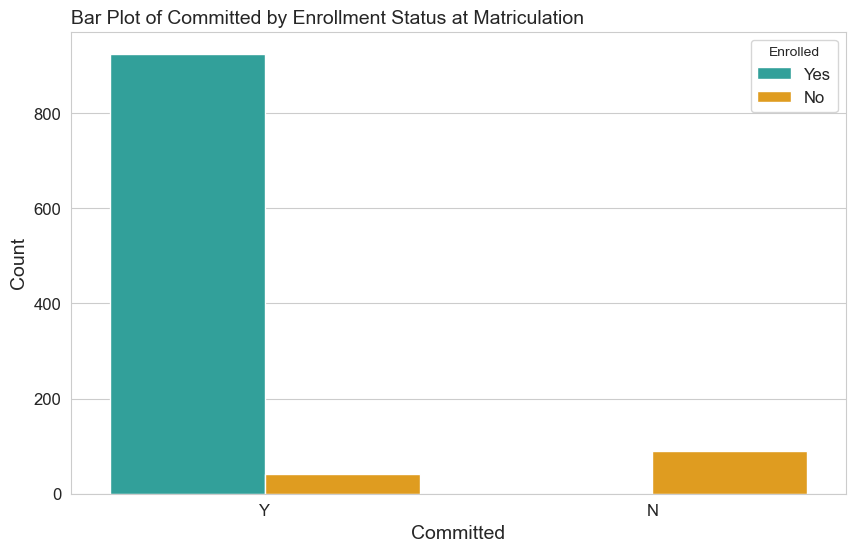

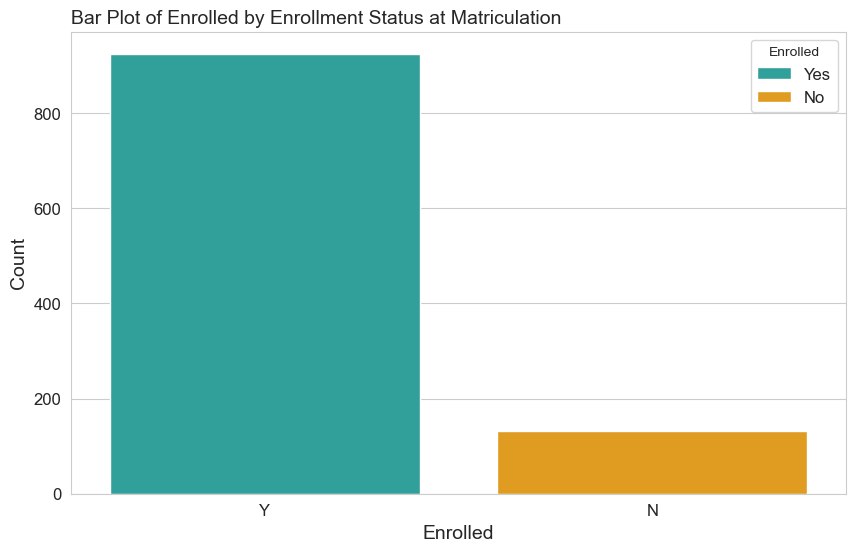

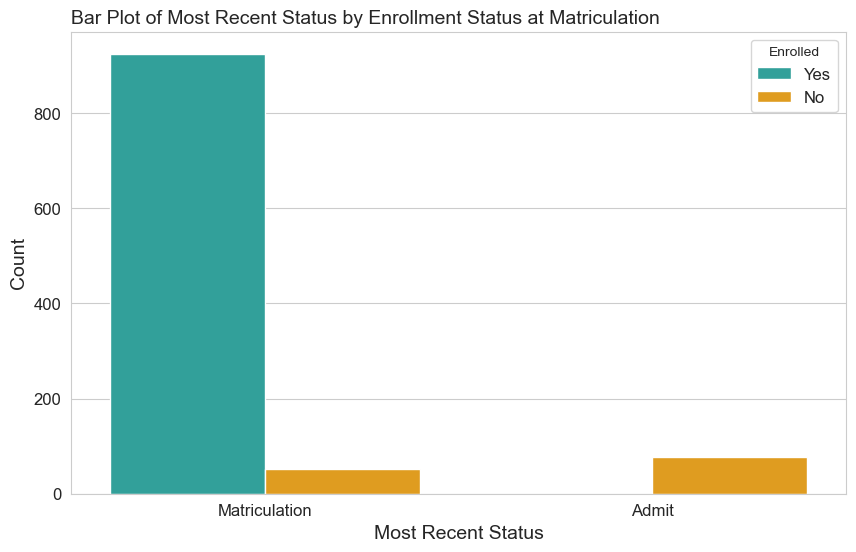

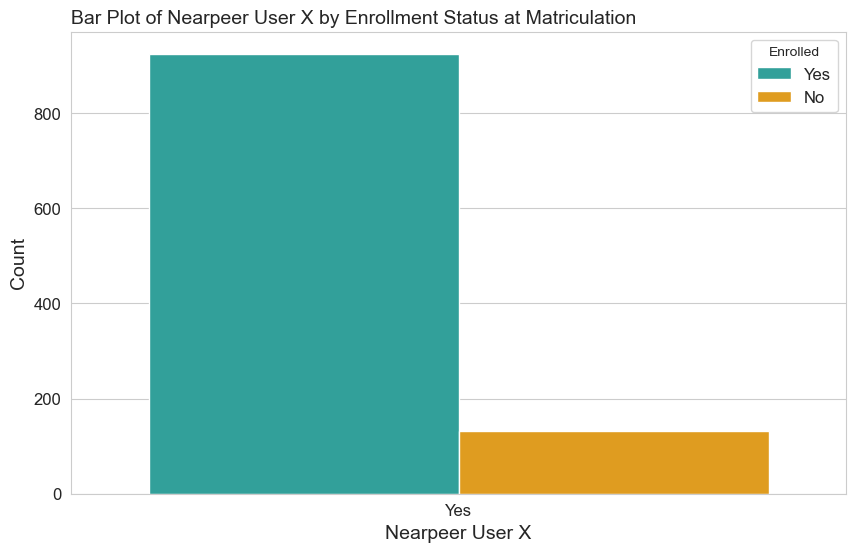

...

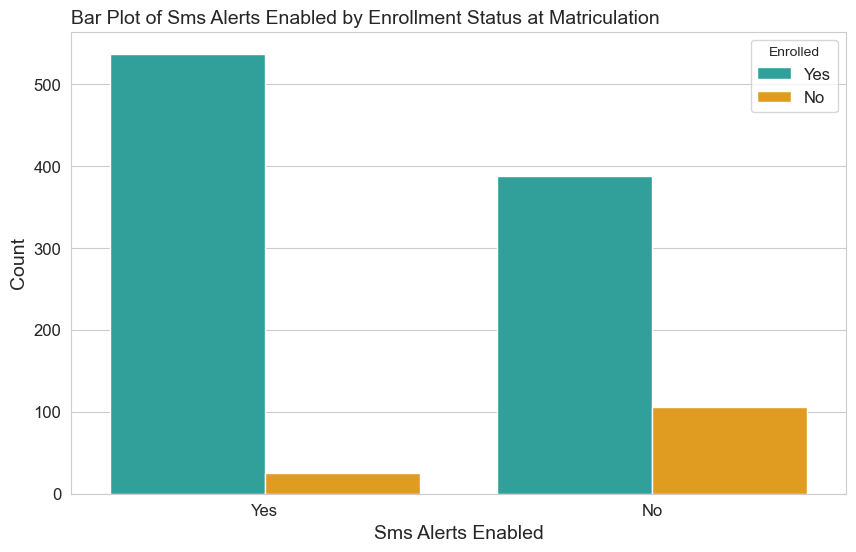

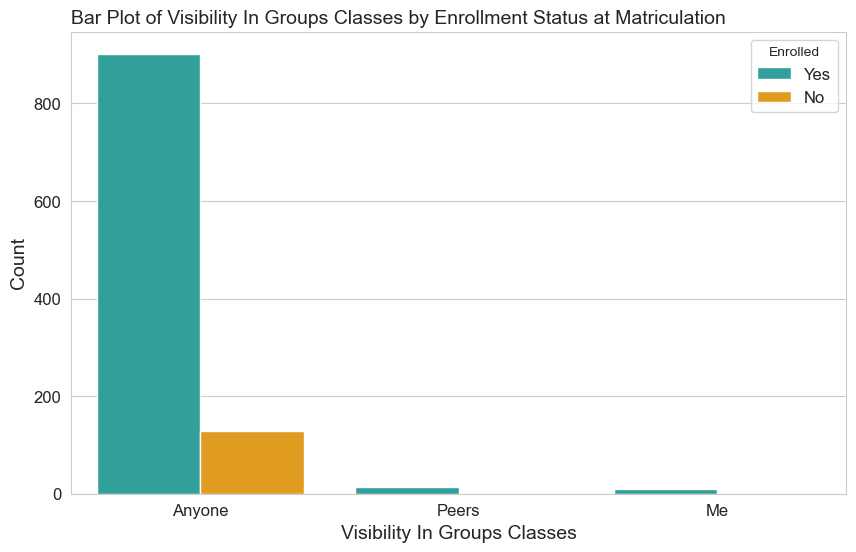

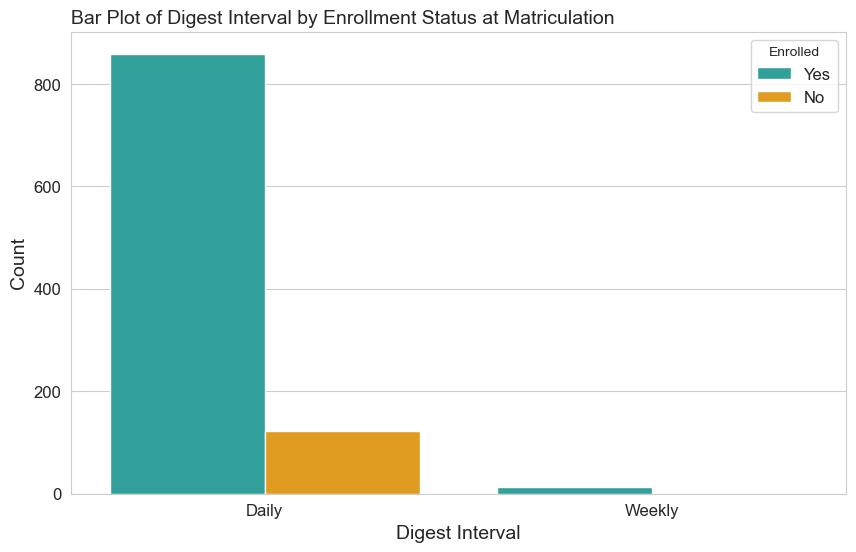

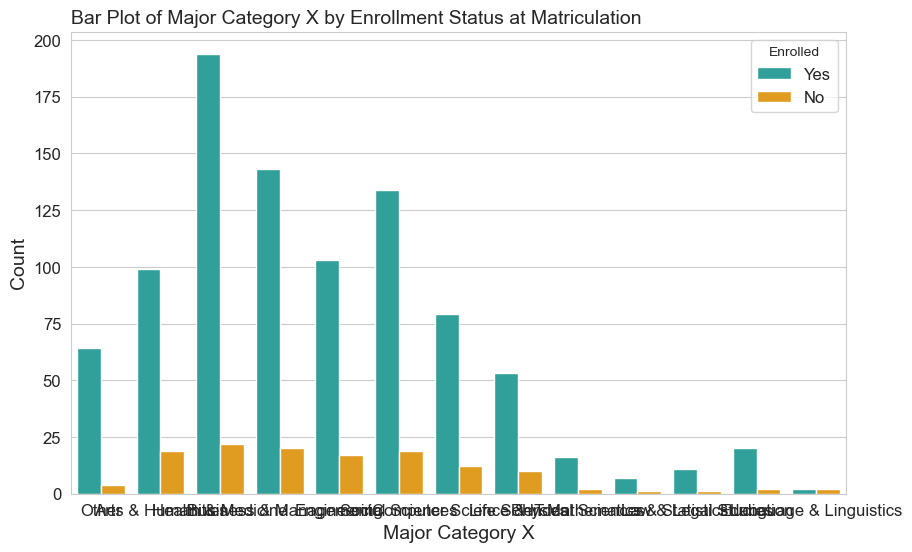

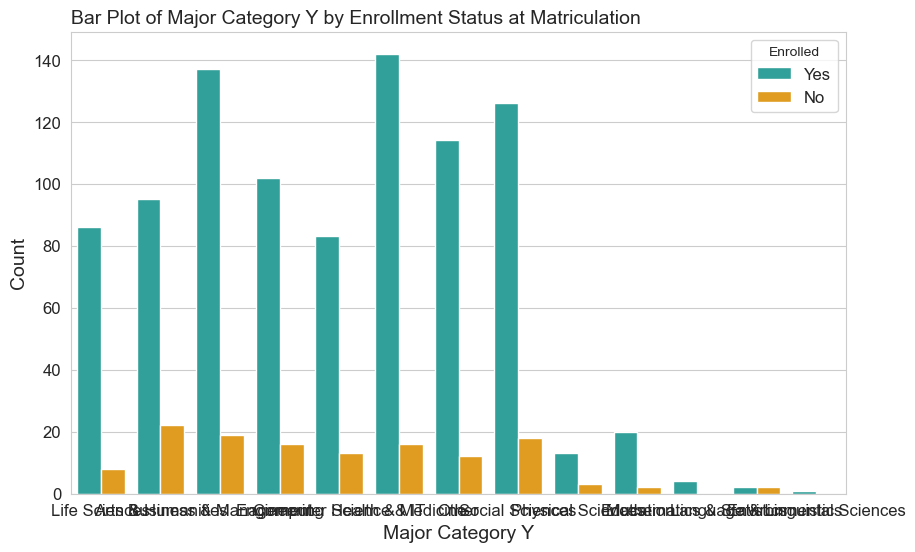

In [23]:
# For each categorical column, create a count plot of the column by enrollment status
for col in categorical_cols:
    plt.figure(figsize=(10, 6))
    sns.countplot(data=df, x=col, hue='enrolled', palette=custom_palette)
    plt.title(f'Bar Plot of {col} by Enrollment')
    # format the title as title case and replace underscores with spaces
    plt.title(f'Bar Plot of {col.replace("_", " ").title()} by Enrollment Status at Matriculation')
    plt.xticks(rotation=0)
    plt.ylabel('Count')
    # Format the x-axis label with title case and replace underscores with spaces
    plt.xlabel(col.replace("_", " ").title())
    plt.legend(title='Enrolled', labels=['Yes', 'No'])
    plt.show()

In [24]:
# # For each categorical column, create a count plot by most_recent_status
# for col in categorical_cols:
#     plt.figure(figsize=(10, 6))
#     sns.countplot(data=df, x=col, hue='most_recent_status')
#     plt.title(f'Count Plot of {col} by Most Recent Status')
#     plt.xticks(rotation=45)
#     plt.show()

### Correlations

Calculating point-biserial correlation for age
   enrolled_num  age
0             1   18
1             1   19
2             1   17
3             1   17
4             1   18
Shape of enrolled_num: (1056,)
Shape of age: (1056,)
Calculating point-biserial correlation for bio_character_count
   enrolled_num  bio_character_count
0             1                  113
1             1                  109
2             1                    0
3             1                    0
4             1                    0
Shape of enrolled_num: (1056,)
Shape of bio_character_count: (1056,)
Calculating point-biserial correlation for interests_count
   enrolled_num  interests_count
0             1               58
1             1              200
2             1                1
3             1                3
4             1               40
Shape of enrolled_num: (1056,)
Shape of interests_count: (1056,)
Calculating point-biserial correlation for groups_count
   enrolled_num  groups_count
0           

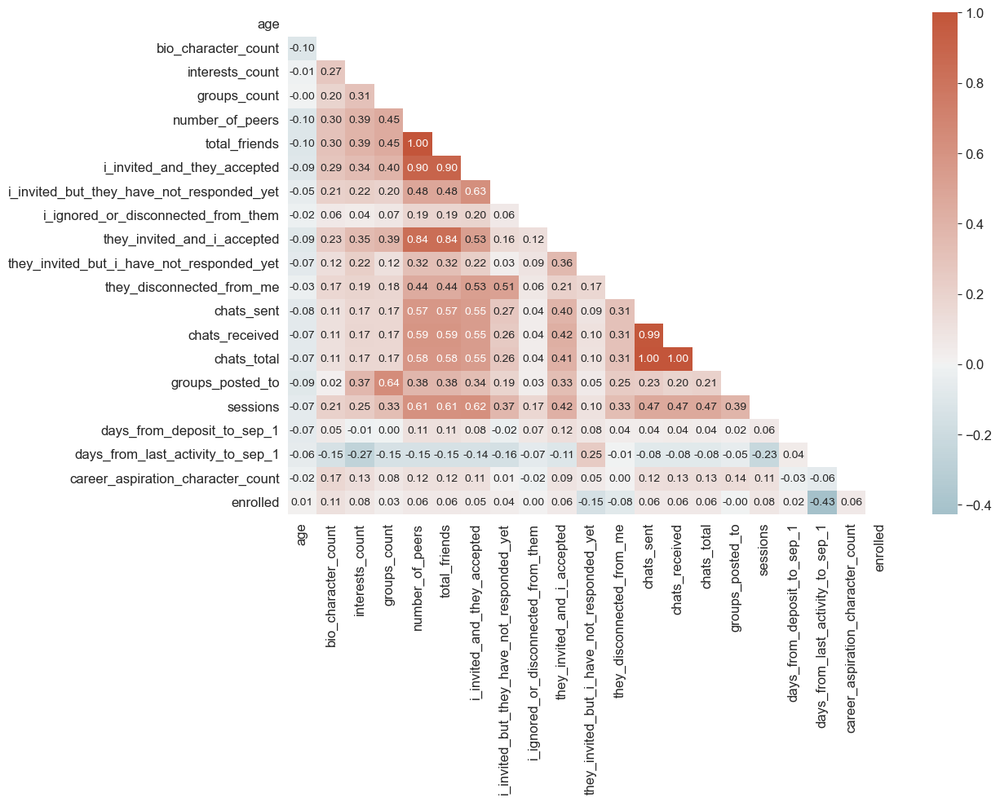

In [25]:
from scipy.stats import pointbiserialr

# Select only numerical columns
numerical_cols = df.select_dtypes(include=['int64', 'float64', 'Int64']).columns.tolist()

# Drop some columns from numerical_cols
exclude_cols = ['graduating_class', 'roux_class_record_id', 'user_id', 'bio_[deleted_for_privacy]', 'invitations', 'enrolled_num', 'enrolled']
numerical_cols = [col for col in numerical_cols if col not in exclude_cols]

# Create a correlation matrix for numerical variables
correlation_matrix = df[numerical_cols].corr()

# Add a numeric column for 'enrolled_num' for point biserial correlation, where Y = 1 and N = 0
df['enrolled_num'] = df['enrolled'].map({'Y': 1, 'N': 0})

# Calculate point biserial correlation between 'enrollment' and other numerical columns
point_biserial_correlations = {}
for col in numerical_cols:
    if df[col].nunique() > 1:  # Ensure there's variability in the data
        df_clean = df[['enrolled_num', col]].dropna()
        print(f"Calculating point-biserial correlation for {col}")
        print(df_clean.head())  # Debugging step
        print(f"Shape of enrolled_num: {df_clean['enrolled_num'].shape}")
        print(f"Shape of {col}: {df_clean[col].shape}")
        try:
            correlation, _ = pointbiserialr(df_clean['enrolled_num'], df_clean[col])
            point_biserial_correlations[col] = correlation
        except Exception as e:
            print(f"Error calculating correlation for {col}: {e}")
            point_biserial_correlations[col] = np.nan  # Set correlation to NaN if error occurs
    else:
        point_biserial_correlations[col] = np.nan  # Set correlation to NaN if no variability

# Add the point biserial correlations to the correlation matrix
correlation_matrix['enrolled'] = pd.Series(point_biserial_correlations)

# Add the 'enrolled' row to the correlation matrix
correlation_matrix.loc['enrolled'] = point_biserial_correlations

# Plot the heatmap
sns.set_style('white')
plt.figure(figsize=(12, 8))
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))
cmap = sns.diverging_palette(220, 20, as_cmap=True)
sns.heatmap(correlation_matrix, annot=True, cmap=cmap, fmt='.2f', mask=mask, center=0)
# plt.title('Correlation Heatmap')
plt.xticks(rotation=90, ha='center', va='top', fontsize=12)
plt.yticks(rotation=0, ha='right', va='center', fontsize=12)
plt.show()
sns.set_style('whitegrid')



In [26]:

correlation_matrix['enrolled']

age                                          0.014879
bio_character_count                          0.110002
interests_count                              0.075145
groups_count                                 0.029097
number_of_peers                              0.062049
total_friends                                0.062049
i_invited_and_they_accepted                  0.052837
i_invited_but_they_have_not_responded_yet    0.035757
i_ignored_or_disconnected_from_them          0.004035
they_invited_and_i_accepted                  0.056291
they_invited_but_i_have_not_responded_yet   -0.154084
they_disconnected_from_me                   -0.078855
chats_sent                                   0.057843
chats_received                               0.061703
chats_total                                  0.059926
groups_posted_to                            -0.004443
sessions                                     0.076782
days_from_deposit_to_sep_1                   0.019942
days_from_last_activity_to_s

In [27]:
# Show the highly correlated pairs of features (correlation > 0.7 or < -0.7)
correlation_pairs = correlation_matrix.stack()
correlation_pairs = correlation_pairs.reset_index()
correlation_pairs.columns = ['feature1', 'feature2', 'correlation']
correlation_pairs['correlation_type'] = correlation_pairs['correlation'].apply(
    lambda x: 'strong positive' if x > 0 else 'strong negative'
)
correlation_pairs = correlation_pairs.apply(
    lambda row: pd.Series(sorted([row['feature1'], row['feature2']]), index=['feature1', 'feature2']) if row['feature1'] > row['feature2'] else row,
    axis=1
)
correlation_pairs = correlation_pairs[((correlation_pairs['correlation'].abs() > 0.7) | 
                                      (correlation_pairs['correlation'] < -0.7)) &
                                      (correlation_pairs['feature1'] != correlation_pairs['feature2'])]
correlation_pairs = correlation_pairs.drop_duplicates(subset=['feature1', 'feature2', 'correlation'])
correlation_pairs.sort_values(by='correlation', ascending=False).reset_index(drop=True)

,correlation,correlation_type,feature1,feature2
0,1.000000,strong positive,number_of_peers,total_friends
1,0.996743,strong positive,chats_sent,chats_total
2,0.996368,strong positive,chats_received,chats_total
3,0.986255,strong positive,chats_received,chats_sent
4,0.903658,strong positive,i_invited_and_they_accepted,number_of_peers
5,0.903658,strong positive,i_invited_and_they_accepted,total_friends
6,0.841454,strong positive,number_of_peers,they_invited_and_i_accepted
7,0.841454,strong positive,they_invited_and_i_accepted,total_friends


In [28]:
# Show the moderately correlated pairs of features (0.7 > correlation > 0.5 or -0.7 < correlation < -0.5)
moderately_correlated_pairs = correlation_matrix.stack()
moderately_correlated_pairs = moderately_correlated_pairs.reset_index()
moderately_correlated_pairs.columns = ['feature1', 'feature2', 'correlation']
moderately_correlated_pairs['correlation_type'] = moderately_correlated_pairs['correlation'].apply(
    lambda x: 'moderate positive' if x > 0 else 'moderate negative'
)
moderately_correlated_pairs = moderately_correlated_pairs.apply(
    lambda row: pd.Series(sorted([row['feature1'], row['feature2']]), index=['feature1', 'feature2']) if row['feature1'] > row['feature2'] else row,
    axis=1
)
moderately_correlated_pairs = moderately_correlated_pairs[((moderately_correlated_pairs['correlation'].abs() > 0.5) &
                                        (moderately_correlated_pairs['correlation'].abs() < 0.7)) &
                                        (moderately_correlated_pairs['feature1'] != moderately_correlated_pairs['feature2'])]
moderately_correlated_pairs = moderately_correlated_pairs.drop_duplicates(subset=['feature1', 'feature2', 'correlation'])
moderately_correlated_pairs.sort_values(by='correlation', ascending=False).reset_index(drop=True)

,correlation,correlation_type,feature1,feature2
0,0.641038,moderate positive,groups_count,groups_posted_to
1,0.631524,moderate positive,i_invited_and_they_accepted,i_invited_but_they_have_not_responded_yet
2,0.623412,moderate positive,i_invited_and_they_accepted,sessions
3,0.610198,moderate positive,number_of_peers,sessions
4,0.610198,moderate positive,sessions,total_friends
5,0.589524,moderate positive,chats_received,number_of_peers
6,0.589524,moderate positive,chats_received,total_friends
7,0.583832,moderate positive,chats_total,number_of_peers
8,0.583832,moderate positive,chats_total,total_friends
9,0.574532,moderate positive,chats_sent,number_of_peers


### Pairplot

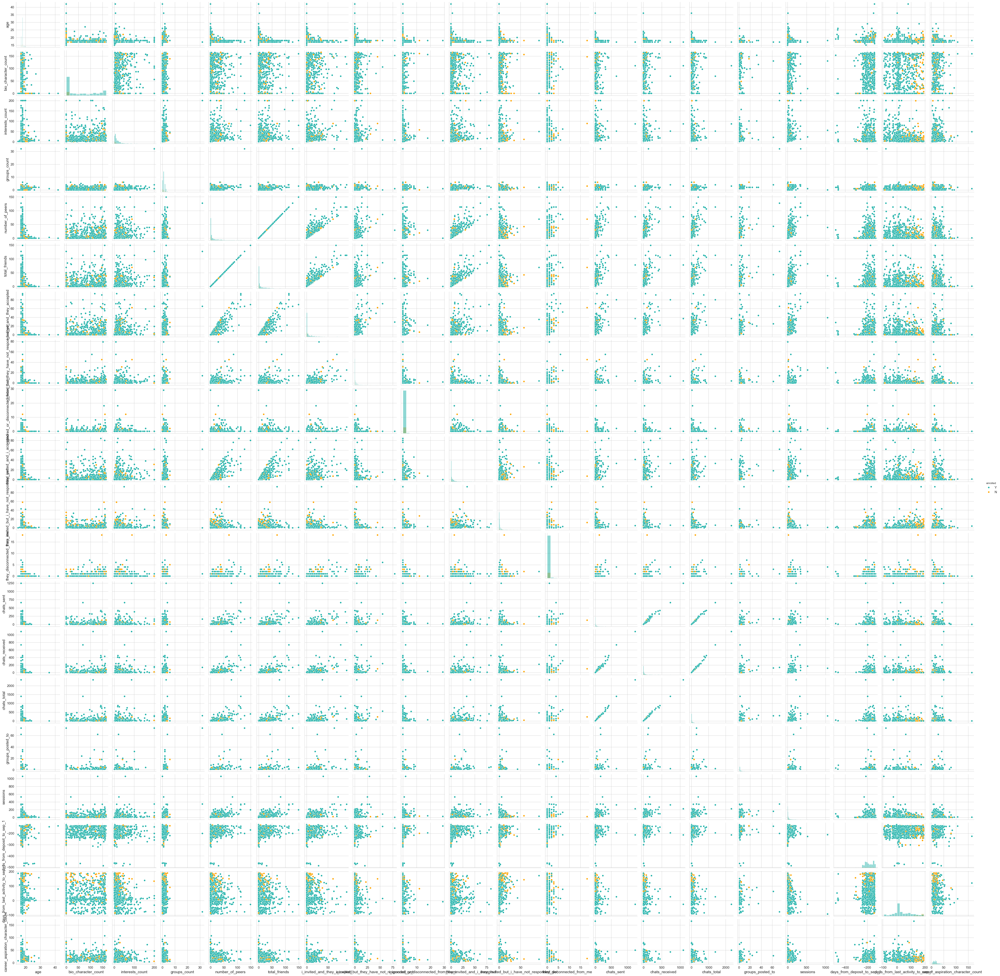

In [29]:
# Pairplot of Numerical Features
sns.pairplot(df[numerical_cols + ['enrolled']], hue='enrolled', diag_kind='hist', palette=custom_palette)
plt.show()

### Boxplots

In [30]:
numerical_cols

['age',
 'bio_character_count',
 'interests_count',
 'groups_count',
 'number_of_peers',
 'total_friends',
 'i_invited_and_they_accepted',
 'i_invited_but_they_have_not_responded_yet',
 'i_ignored_or_disconnected_from_them',
 'they_invited_and_i_accepted',
 'they_invited_but_i_have_not_responded_yet',
 'they_disconnected_from_me',
 'chats_sent',
 'chats_received',
 'chats_total',
 'groups_posted_to',
 'sessions',
 'days_from_deposit_to_sep_1',
 'days_from_last_activity_to_sep_1',
 'career_aspiration_character_count']

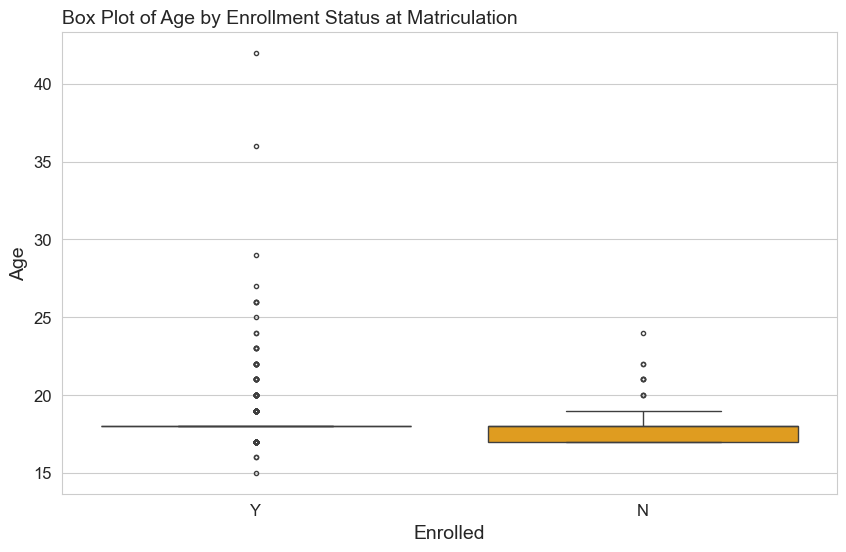

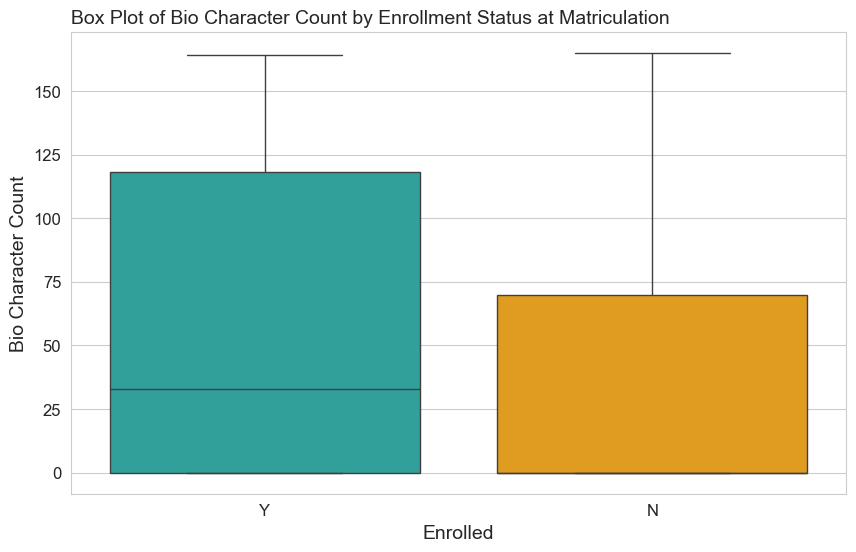

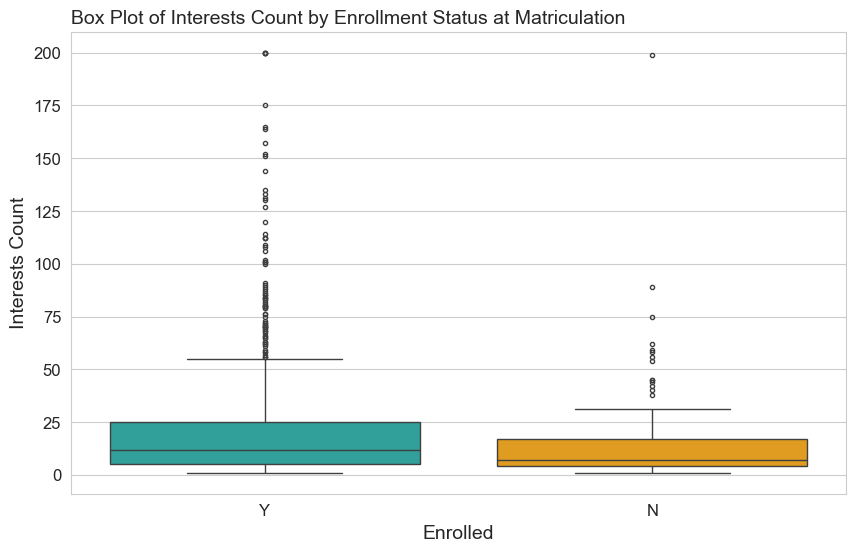

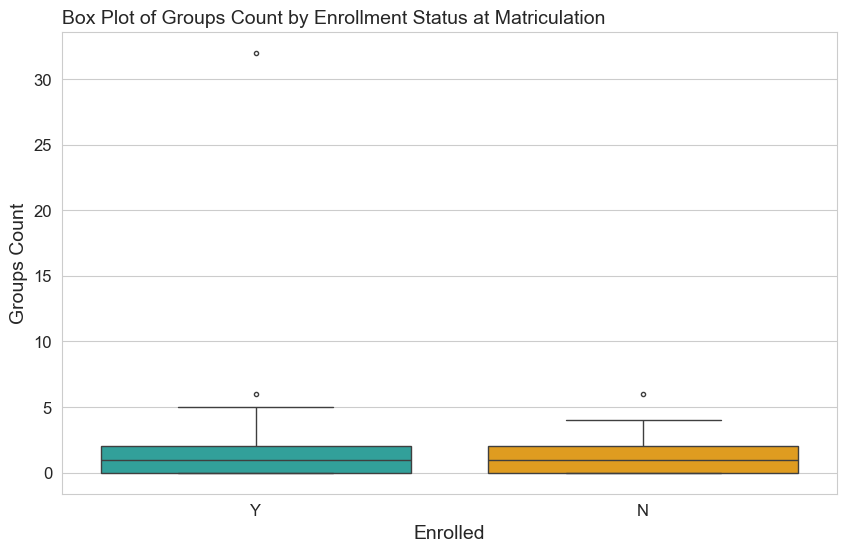

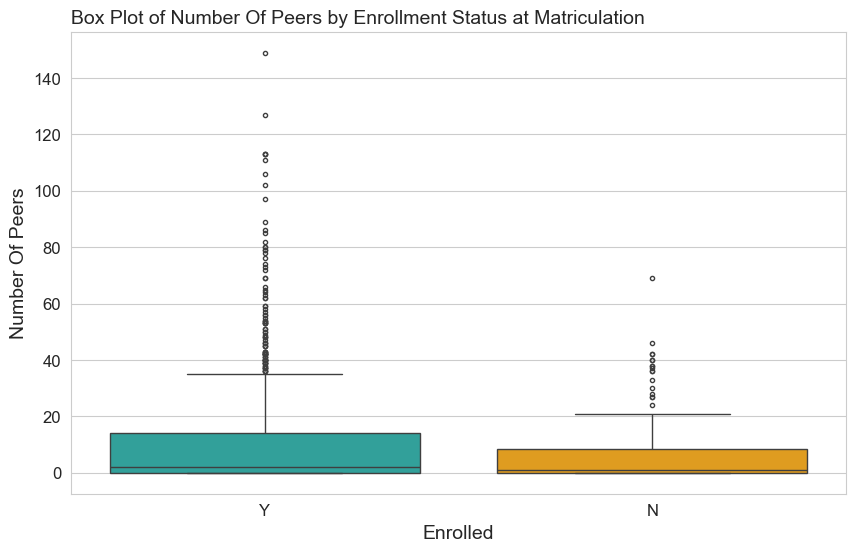

...

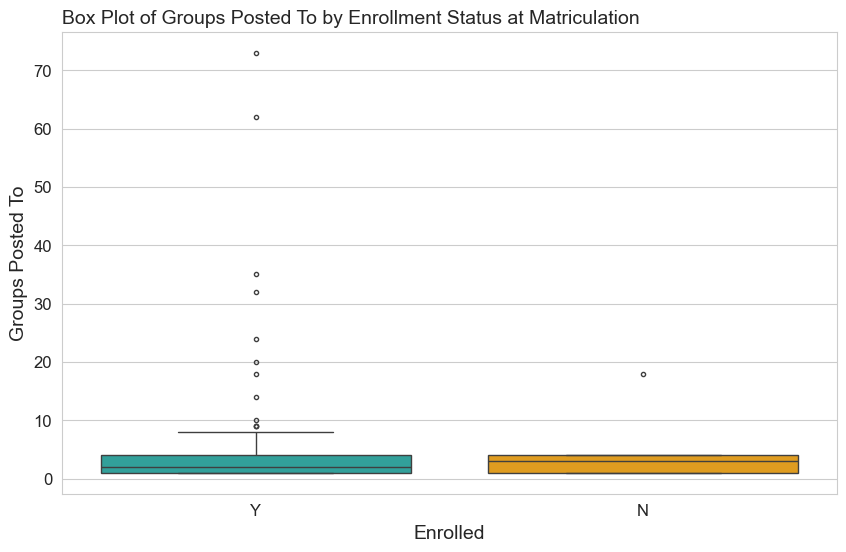

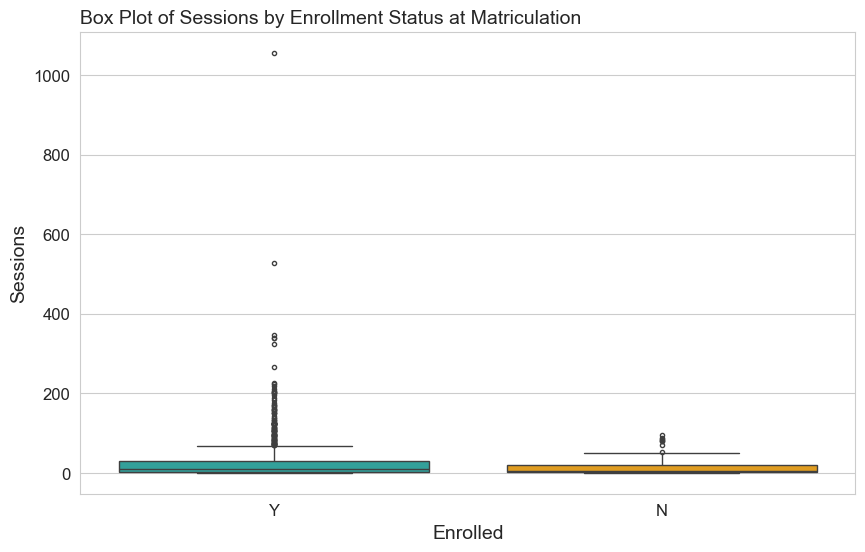

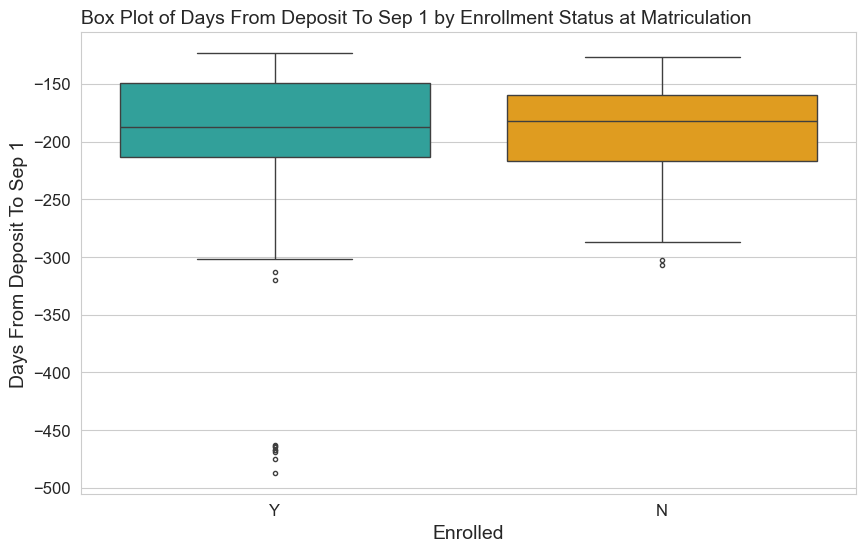

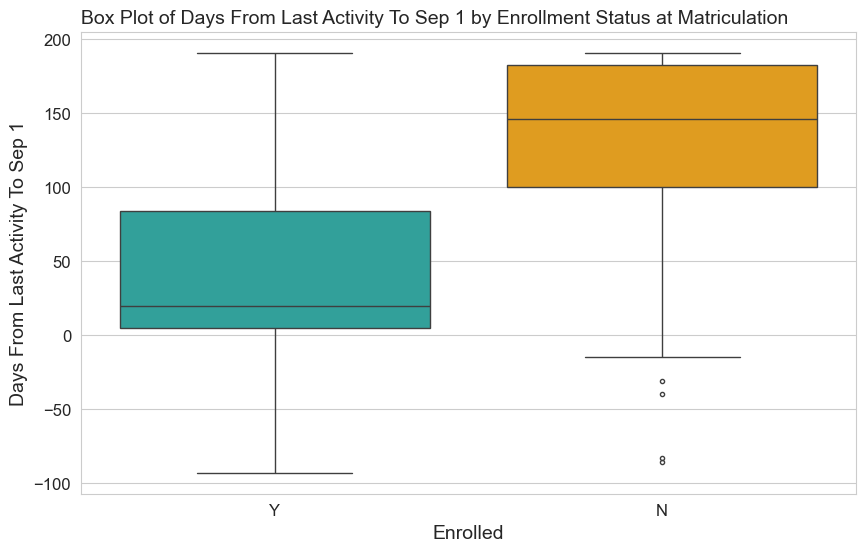

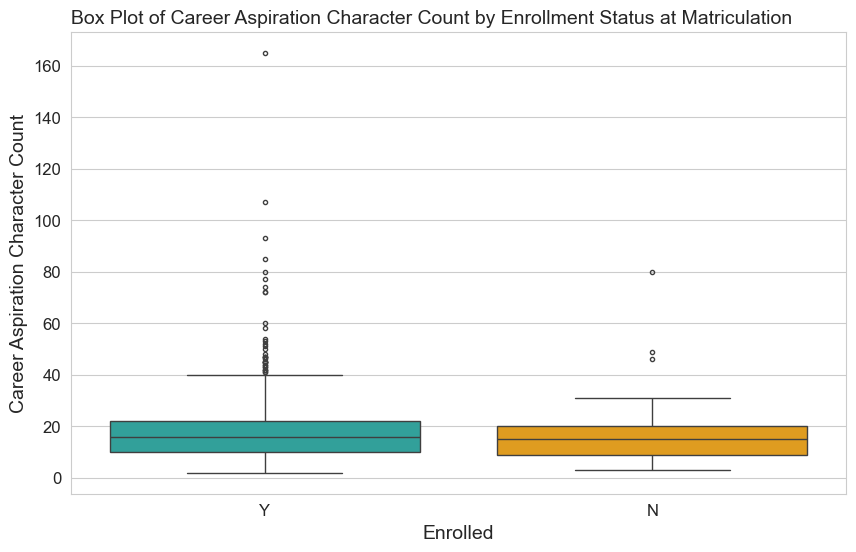

In [31]:
# Plot boxplots by 'enrolled' for each numerical column
for col in numerical_cols:
    plt.figure(figsize=(10, 6))
    sns.boxplot(data=df, x='enrolled', y=col, fliersize=3, hue='enrolled', palette=custom_palette)
    plt.title(f'Box Plot of {col.replace("_", " ").title()} by Enrollment Status at Matriculation')
    plt.ylabel(col.replace("_", " ").title())
    plt.xlabel('Enrolled')
    plt.show()

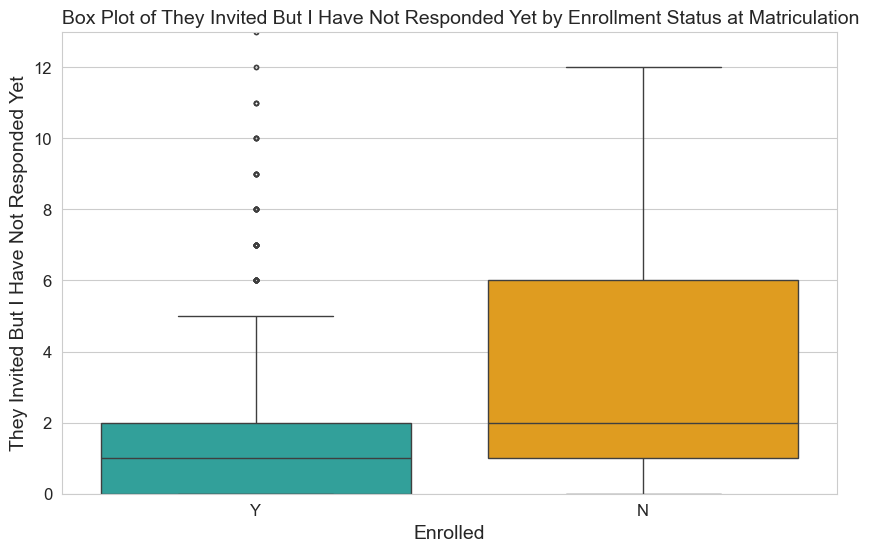

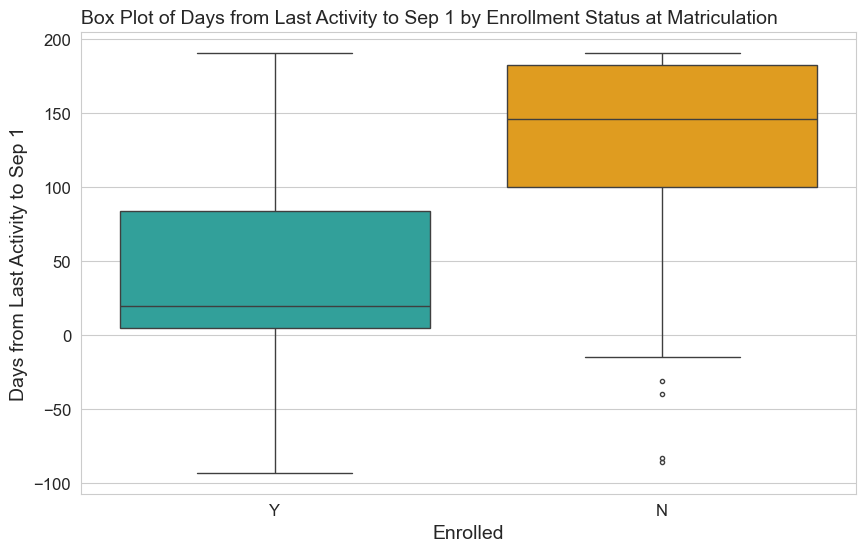

In [32]:
# Box plot of 'they_invited_but_i_have_not_responded_yet' by 'enrolled'
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='enrolled', y='they_invited_but_i_have_not_responded_yet', fliersize=3, hue='enrolled', palette=custom_palette)
plt.title('Box Plot of They Invited But I Have Not Responded Yet by Enrollment Status at Matriculation')
plt.ylabel('They Invited But I Have Not Responded Yet')
plt.xlabel('Enrolled')
plt.ylim(0, 13)
plt.show()

# Box plot of 'days_from_last_activity_to_sep_1' by 'enrolled'
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='enrolled', y='days_from_last_activity_to_sep_1', fliersize=3, hue='enrolled', palette=custom_palette)
plt.title('Box Plot of Days from Last Activity to Sep 1 by Enrollment Status at Matriculation')
plt.ylabel('Days from Last Activity to Sep 1')
plt.xlabel('Enrolled')
plt.show()


### T-tests
Tells you if there is a significant difference between the mean values of each group.

In [33]:
from scipy.stats import ttest_ind

# Convert Int64 columns to float64 to ensure compatibility with statistical tests
for col in numerical_cols:
    df[col] = df[col].astype('float64')

# Perform the t-tests
ttest_results = pd.DataFrame(columns=['feature', 't_statistic', 'p_value'])

for col in numerical_cols:
    enrolled_values = df[df['enrolled'] == 'Y'][col].dropna()
    not_enrolled_values = df[df['enrolled'] == 'N'][col].dropna()
    if len(enrolled_values) > 1 and len(not_enrolled_values) > 1:
        t_statistic, p_value = ttest_ind(enrolled_values, not_enrolled_values)
        result_df = pd.DataFrame([[col, t_statistic, p_value]], columns=['feature', 't_statistic', 'p_value'])
        ttest_results = pd.concat([ttest_results, result_df], ignore_index=True)

# Sort and display results
ttest_results.sort_values(by='p_value', ascending=True, inplace=True)
ttest_results.reset_index(drop=True, inplace=True)
ttest_results

# List the features with p-values less than 0.05
significant_features = ttest_results[ttest_results['p_value'] < 0.05]
significant_features

C:\Users\dyork\AppData\Local\Temp\ipykernel_38240\3750830403.py:16: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  ttest_results = pd.concat([ttest_results, result_df], ignore_index=True)


,feature,t_statistic,p_value
0,days_from_last_activity_to_sep_1,-15.360427,3.340942e-48
1,they_invited_but_i_have_not_responded_yet,-5.062841,4.872480e-07
2,bio_character_count,3.593045,3.419323e-04
3,they_disconnected_from_me,-2.568047,1.036419e-02
4,interests_count,2.446534,1.458625e-02
5,sessions,2.427942,1.536140e-02
6,number_of_peers,2.018330,4.380981e-02
7,total_friends,2.018330,4.380981e-02


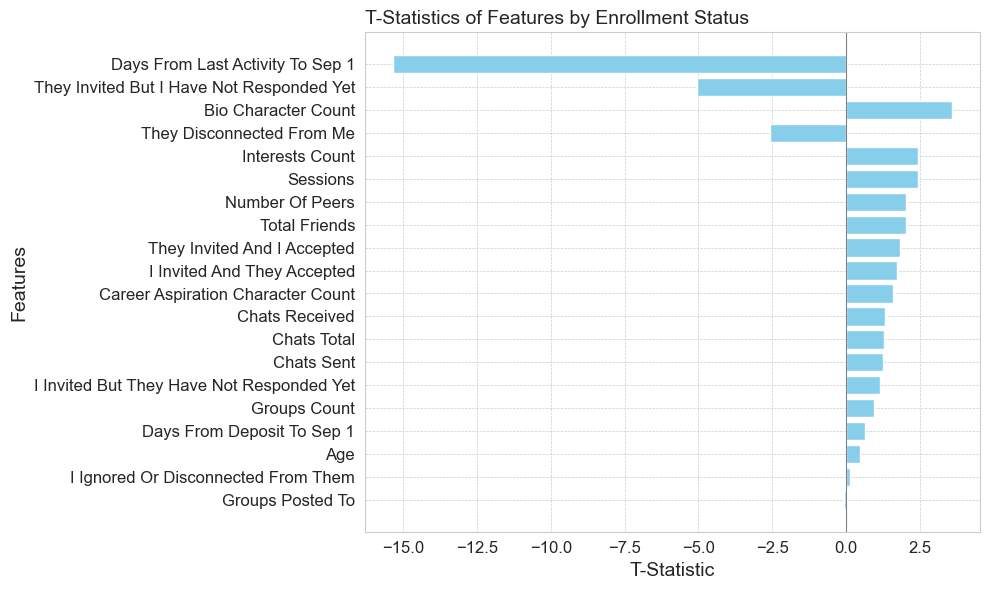

In [34]:
plt.figure(figsize=(10, 6))
plt.barh(ttest_results['feature'][::-1], ttest_results['t_statistic'][::-1], color='skyblue')
plt.ylabel('Features')
plt.xlabel('T-Statistic')
plt.title('T-Statistics of Features by Enrollment Status')
plt.yticks(ticks=range(len(ttest_results['feature'])), labels=ttest_results['feature'][::-1].str.replace('_', ' ').str.title())
plt.axvline(0, color='gray', linewidth=0.8)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()

### Histograms by enrollment

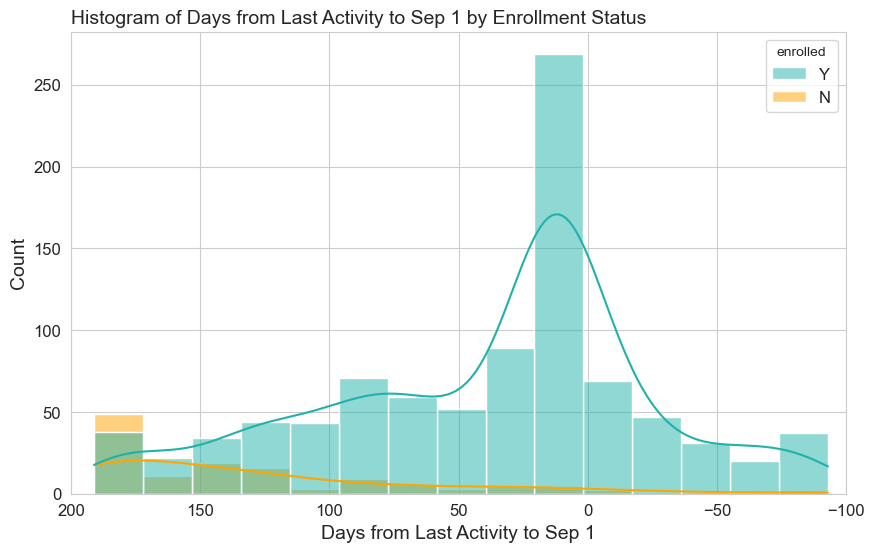

In [35]:
# # Plot a histogram of each numerical column by 'enrolled'
# for col in numerical_cols:
#     plt.figure(figsize=(10, 6))
#     sns.histplot(data=df, x=col, hue='enrolled', kde=True)
#     plt.title(f'Histogram of {col} by Enrollment Status')
#     plt.show()

# Plot of histogram of 'days_from_last_activity_to_sep_1' by 'enrolled'
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='days_from_last_activity_to_sep_1', hue='enrolled', kde=True, palette=custom_palette)
plt.title('Histogram of Days from Last Activity to Sep 1 by Enrollment Status')
plt.xlabel('Days from Last Activity to Sep 1')
plt.xlim(200, -100)
plt.show()

### Visuals showing 3 dimensions

In [36]:
df.columns

Index(['roux_class_record_id', 'admitted', 'committed', 'enrolled',
       'most_recent_status', 'nearpeer_user_x', 'user_id',
       'application_student_type', 'deposit_date', 'orientation_attendance',
       'country', 'hispanic_ethnicity', 'race', 'residency', 'college',
       'nearpeer_user_y', 'badge', 'enabled', 'verified_email',
       'profile_created', 'age', 'bio_[deleted_for_privacy]',
       'bio_character_count', 'interests', 'interests_count', 'groups',
       'groups_count', 'number_of_peers', 'incoming_class', 'graduating_class',
       'lives_on_campus', 'transfer_student', 'veteran', 'parent',
       'online_student', 'open_to_social_connections', 'full_time_part_time',
       'gender', 'sms_alerts_enabled', 'visibility_in_groups_classes',
       'digest_interval', 'profile_completed_date', 'last_activity_date',
       'passions', 'last_group_message', 'invitations',
       'first_invitation_date', 'last_invitation_date', 'total_friends',
       'i_invited_and_they_

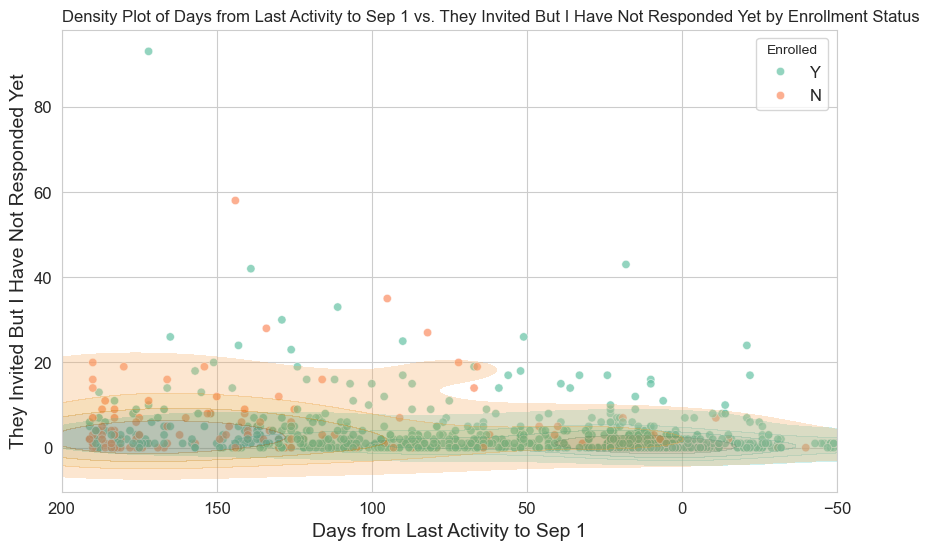

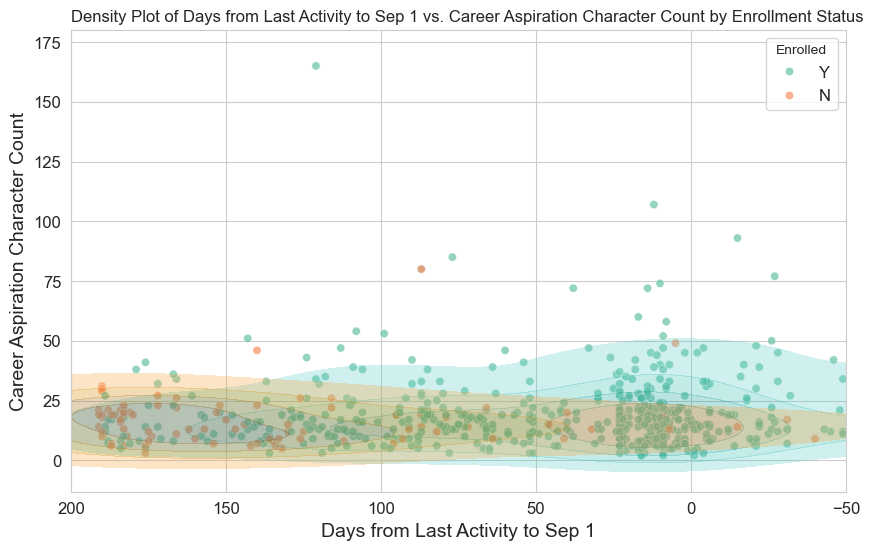

In [37]:
# Showing a negative association with one variable?
plt.figure(figsize=(10, 6))
var = 'they_invited_but_i_have_not_responded_yet'
# Scatter plot
sns.scatterplot(data=df, x='days_from_last_activity_to_sep_1', y=var, hue='enrolled', alpha=0.7)
# KDE plot for enrolled students
sns.kdeplot(data=df[df['enrolled'] == 'Y'], x='days_from_last_activity_to_sep_1', y=var, 
            fill=True, levels=5, color='lightseagreen', thresh=0.1, alpha=0.3, linestyles='-', label='Enrolled')
# KDE plot for not enrolled students
sns.kdeplot(data=df[df['enrolled'] == 'N'], x='days_from_last_activity_to_sep_1', y=var, 
            fill=True, levels=5, color='orange', thresh=0.1, alpha=0.3, linestyles='-', label='Not Enrolled')
plt.title(f'Density Plot of Days from Last Activity to Sep 1 vs. {var} by Enrollment Status')
# format title as title case and replace underscores with spaces
plt.title(f'Density Plot of Days from Last Activity to Sep 1 vs. {var.replace("_", " ").title()} by Enrollment Status', size=12)
plt.xlim(200, -50)
# plt.ylim(0, 12)
plt.xlabel('Days from Last Activity to Sep 1')
plt.ylabel(var)
# Format y label as title case and replace underscores with spaces
plt.ylabel(var.replace("_", " ").title())
plt.legend(title='Enrolled')
plt.show()


# Showing a positive association with another variable?
plt.figure(figsize=(10, 6))
var = 'career_aspiration_character_count'
# Scatter plot
sns.scatterplot(data=df, x='days_from_last_activity_to_sep_1', y=var, hue='enrolled', alpha=0.7)
# KDE plot for enrolled students
sns.kdeplot(data=df[df['enrolled'] == 'Y'], x='days_from_last_activity_to_sep_1', y=var, 
            fill=True, levels=5, color='lightseagreen', thresh=0.1, alpha=0.3, linestyles='-', label='Enrolled')
# KDE plot for not enrolled students
sns.kdeplot(data=df[df['enrolled'] == 'N'], x='days_from_last_activity_to_sep_1', y=var, 
            fill=True, levels=5, color='orange', thresh=0.1, alpha=0.3, linestyles='-', label='Not Enrolled')
plt.title(f'Density Plot of Days from Last Activity to Sep 1 vs. {var} by Enrollment Status')
# format title as title case and replace underscores with spaces
plt.title(f'Density Plot of Days from Last Activity to Sep 1 vs. {var.replace("_", " ").title()} by Enrollment Status', size=12)
plt.xlim(200, -50)
plt.xlabel('Days from Last Activity to Sep 1')
plt.ylabel(var)
# Format y label as title case and replace underscores with spaces
plt.ylabel(var.replace("_", " ").title())
plt.legend(title='Enrolled')
plt.show()


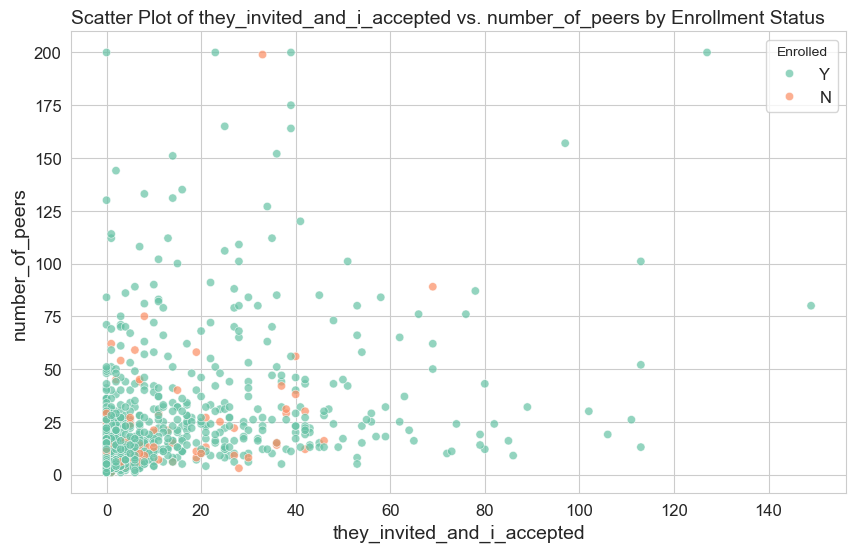

In [38]:
# Scatter plots...

var1 = 'total_friends'
var2 = 'interests_count'
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x=var1, y=var2, hue='enrolled', alpha=0.7)
plt.title('Scatter Plot of they_invited_and_i_accepted vs. number_of_peers by Enrollment Status')
plt.xlabel('they_invited_and_i_accepted')
plt.ylabel('number_of_peers')
plt.legend(title='Enrolled')
plt.show()

## Text mining
Goal: to extract the most common words in the text data (columns 'interests', 'passions')

In [39]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.linear_model import LogisticRegression

# Pre-process interests to treat comma-separated values as single tokens
df['interests_processed'] = df['interests'].apply(lambda x: x.split(', '))

# Combine interests and create target variable
interests = df['interests_processed']
target = (df['enrolled'] == 'Y').astype(int)

# Vectorize the interests
vectorizer = CountVectorizer(tokenizer=lambda x: x, preprocessor=lambda x: x)
X = vectorizer.fit_transform(interests)

# Fit the logistic regression model
model = LogisticRegression(max_iter=1000)
model.fit(X, target)

# Get the words and their corresponding coefficients
words = vectorizer.get_feature_names_out()
coefficients = model.coef_[0]

# Create a DataFrame to display words and their association with non-enrollment
word_assoc_df = pd.DataFrame({'phrase': words, 'association_with_non_enrollment': coefficients})
word_assoc_df = word_assoc_df.sort_values(by='association_with_non_enrollment', ascending=False)

# Extract the top 100 phrases most strongly associated with non-enrollment and enrollment
top_100_phrases_non_enrollment = word_assoc_df.head(100)
top_100_phrases_enrollment = word_assoc_df.tail(100).sort_values(by='association_with_non_enrollment', ascending=True)

# Reverse the order of top 100 phrases associated with enrollment and reindex
top_100_phrases_enrollment = top_100_phrases_enrollment.iloc[::-1].reset_index(drop=True)

# Use these top 100 phrases for the word clouds
phrases_dict_enrollment = dict(zip(top_100_phrases_enrollment['phrase'], top_100_phrases_enrollment['association_with_non_enrollment'].abs()))
phrases_dict_non_enrollment = dict(zip(top_100_phrases_non_enrollment['phrase'], top_100_phrases_non_enrollment['association_with_non_enrollment']))

# Generate the word clouds
wordcloud_enrollment = WordCloud(width=800, height=400, background_color='white', colormap='Greens').generate_from_frequencies(phrases_dict_enrollment)
wordcloud_non_enrollment = WordCloud(width=800, height=400, background_color='white', colormap='OrRd').generate_from_frequencies(phrases_dict_non_enrollment)

# Plot the word clouds
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud_enrollment, interpolation='bilinear')
plt.axis('off')
plt.title('Top 100 Phrases Strongly Associated with Enrollment')
plt.show()

plt.figure(figsize=(10, 6))
plt.imshow(wordcloud_non_enrollment, interpolation='bilinear')
plt.axis('off')
plt.title('Top 100 Phrases Strongly Associated with Non-Enrollment')
plt.show()

# Extract the top 10 phrases for the bar plots
top_phrases_non_enrollment = top_100_phrases_non_enrollment.head(10)
top_phrases_enrollment = top_100_phrases_enrollment.tail(10).sort_values(by='association_with_non_enrollment', ascending=True)

# Plot top 10 phrases most strongly associated with non-enrollment
plt.figure(figsize=(10, 6))
sns.barplot(y='phrase', x='association_with_non_enrollment', data=top_phrases_non_enrollment, palette='Oranges_r')
plt.title('Top 10 Phrases in "Interests" Column Strongly Associated with Non-Enrollment')
plt.ylabel('Phrases')
plt.xlabel('Association with Non-Enrollment')
plt.show()

# Plot top 10 phrases most strongly associated with enrollment (using absolute values)
top_phrases_enrollment['association_with_non_enrollment'] = top_phrases_enrollment['association_with_non_enrollment'].abs()

plt.figure(figsize=(10, 6))
sns.barplot(y='phrase', x='association_with_non_enrollment', data=top_phrases_enrollment, palette='Greens_r')
plt.title('Top 10 Phrases in "Interests" Column Strongly Associated with Enrollment')
plt.ylabel('Phrases')
plt.xlabel('Association with Enrollment')
plt.show()


## Modeling
### Data preprocessing

In [ ]:
# Split the data into test and train sets
from sklearn.model_selection import train_test_split

# Drop the 'enrolled' column
X = df.drop('enrolled', axis=1)
y = df['enrolled']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Check the shape of the train and test sets
print(f'The shape of X_train is: {X_train.shape}')
print(f'The shape of X_test is: {X_test.shape}')
print(f'The shape of y_train is: {y_train.shape}')
print(f'The shape of y_test is: {y_test.shape}')

The shape of X_train is: (844, 66)
The shape of X_test is: (212, 66)
The shape of y_train is: (844,)
The shape of y_test is: (212,)


In [ ]:
# Assess missing values in the training set
missing_values = X_train.isnull().mean() * 100
missing_values.sort_values(ascending=False, inplace=True)
for column_name, percentage in missing_values.items():
    print(f'{column_name}: {percentage:0.4}%')

bio_[deleted_for_privacy]: 100.0%
first_invitation_date: 99.53%
invitations: 99.53%
groups_posted_to: 86.26%
passions: 73.46%
chats_total: 55.21%
chats_sent: 55.21%
chats_received: 55.21%
last_group_message: 49.17%
hispanic_ethnicity: 44.67%
career_aspiration_character_count: 37.8%
profile_completed_date: 27.49%
groups: 27.13%
last_invitation_date: 15.17%
graduating_class: 14.45%
digest_interval: 5.924%
sessions: 5.569%
days_from_deposit_to_sep_1: 5.569%
deposit_date: 5.569%
last_activity_date: 0.0%
visibility_in_groups_classes: 0.0%
roux_class_record_id: 0.0%
they_invited_and_i_accepted: 0.0%
total_friends: 0.0%
i_invited_and_they_accepted: 0.0%
i_invited_but_they_have_not_responded_yet: 0.0%
i_ignored_or_disconnected_from_them: 0.0%
gender: 0.0%
they_invited_but_i_have_not_responded_yet: 0.0%
they_disconnected_from_me: 0.0%
days_from_last_activity_to_sep_1: 0.0%
major_category_x: 0.0%
major_category_y: 0.0%
major_categories_match: 0.0%
sms_alerts_enabled: 0.0%
online_student: 0.0%
fu

In [ ]:
# Drop columns with more than 70% missing values
columns_to_drop = missing_values[missing_values > 70].index
X_train = X_train.drop(columns=columns_to_drop)
X_test = X_test.drop(columns=columns_to_drop)

# Assess missing values in the training set
missing_values = X_train.isnull().mean() * 100
missing_values.sort_values(ascending=False, inplace=True)
for column_name, percentage in missing_values.items():
    print(f'{column_name}: {percentage:0.4}%')

chats_total: 55.21%
chats_sent: 55.21%
chats_received: 55.21%
last_group_message: 49.17%
hispanic_ethnicity: 44.67%
career_aspiration_character_count: 37.8%
profile_completed_date: 27.49%
groups: 27.13%
last_invitation_date: 15.17%
graduating_class: 14.45%
digest_interval: 5.924%
sessions: 5.569%
days_from_deposit_to_sep_1: 5.569%
deposit_date: 5.569%
total_friends: 0.0%
visibility_in_groups_classes: 0.0%
last_activity_date: 0.0%
sms_alerts_enabled: 0.0%
gender: 0.0%
roux_class_record_id: 0.0%
they_invited_and_i_accepted: 0.0%
i_invited_and_they_accepted: 0.0%
i_invited_but_they_have_not_responded_yet: 0.0%
i_ignored_or_disconnected_from_them: 0.0%
open_to_social_connections: 0.0%
they_invited_but_i_have_not_responded_yet: 0.0%
they_disconnected_from_me: 0.0%
days_from_last_activity_to_sep_1: 0.0%
major_category_x: 0.0%
major_category_y: 0.0%
major_categories_match: 0.0%
full_time_part_time: 0.0%
veteran: 0.0%
online_student: 0.0%
parent: 0.0%
committed: 0.0%
most_recent_status: 0.0%
n

#### Dropping columns

In [ ]:
# Drop columns because the are not useful for the model and they have many missing values
X_train = X_train.drop(columns=['groups', 'graduating_class', 'roux_class_record_id', 'interests', 'incoming_class', 'committed', 'college', 'interests_processed'])
X_test = X_test.drop(columns=['groups', 'graduating_class', 'roux_class_record_id', 'interests', 'incoming_class', 'committed', 'college', 'interests_processed'])

# Drop 'orientation_attendance' because it explains MOST of the variance in the target variable
# X_train = X_train.drop(columns='orientation_attendance')
# X_test = X_test.drop(columns='orientation_attendance')

# Drop profile_completed_date and last_invitation_date because there are too many missing values
X_train = X_train.drop(columns=['profile_completed_date', 'last_invitation_date'])
X_test = X_test.drop(columns=['profile_completed_date', 'last_invitation_date'])

# Drop 'last_group_message' because there are too many missing values
X_train = X_train.drop(columns='last_group_message')
X_test = X_test.drop(columns='last_group_message')

# Drop 'hispanic_ethnicity' because there are too many missing values
X_train = X_train.drop(columns='hispanic_ethnicity')
X_test = X_test.drop(columns='hispanic_ethnicity')

# Drop 'deposit_date' because it has been replaced by 'days_from_deposit_to_sep_1'
X_train = X_train.drop(columns='deposit_date')
X_test = X_test.drop(columns='deposit_date')

# Drop 'last_activity_date' because we don't know when the data was pulled
X_train = X_train.drop(columns='last_activity_date')
X_test = X_test.drop(columns='last_activity_date')

# Drop 'country' because new values appeared in the test data that were not present in the train data
X_train = X_train.drop(columns='country')
X_test = X_test.drop(columns='country')

#### Imputing columns

In [ ]:
# Fill missing values in chats_total, chats_received and chats_sent with 0
X_train['chats_total'] = X_train['chats_total'].fillna(0)
X_train['chats_received'] = X_train['chats_received'].fillna(0)
X_train['chats_sent'] = X_train['chats_sent'].fillna(0)
X_test['chats_total'] = X_test['chats_total'].fillna(0)
X_test['chats_received'] = X_test['chats_received'].fillna(0)
X_test['chats_sent'] = X_test['chats_sent'].fillna(0)

# Fill missing values in 'bio_character_count' with 0
X_train['bio_character_count'] = X_train['bio_character_count'].fillna(0)
X_test['bio_character_count'] = X_test['bio_character_count'].fillna(0)

# Fill missing values in 'sessions' with 0
X_train['sessions'] = X_train['sessions'].fillna(0)
X_test['sessions'] = X_test['sessions'].fillna(0)

# Fill missing values in 'career_aspiration_character_count' with 0
X_train['career_aspiration_character_count'] = X_train['career_aspiration_character_count'].fillna(0)
X_test['career_aspiration_character_count'] = X_test['career_aspiration_character_count'].fillna(0)

# Fill missing values in 'days_from_deposit_to_sep_1' with the median
X_train['days_from_deposit_to_sep_1'] = X_train['days_from_deposit_to_sep_1'].fillna(X_train['days_from_deposit_to_sep_1'].median())
X_test['days_from_deposit_to_sep_1'] = X_test['days_from_deposit_to_sep_1'].fillna(X_train['days_from_deposit_to_sep_1'].median())

# Fill in missing values in 'digest_interval' with the mode
X_train['digest_interval'] = X_train['digest_interval'].fillna(X_train['digest_interval'].mode()[0])
X_test['digest_interval'] = X_test['digest_interval'].fillna(X_train['digest_interval'].mode()[0])

In [ ]:
# # Plot a histogram of 'deposit_date' in the original dataset
# plt.figure(figsize=(10, 6))
# sns.histplot(data=df, x='days_from_deposit_to_sep_1', kde=True)
# plt.title('Histogram of days_from_deposit_to_sep_1')
# plt.show()

# # Plot a histogram of 'deposit_date' in the training set
# plt.figure(figsize=(10, 6))
# sns.histplot(data=X_train, x='days_from_deposit_to_sep_1', kde=True)
# plt.title('Histogram of days_from_deposit_to_sep_1 in the training set')
# plt.show()


In [ ]:
# Assess missing values in the training set
missing_values = X_train.isnull().mean() * 100
missing_values.sort_values(ascending=False, inplace=True)
for column_name, percentage in missing_values.items():
    print(f'{column_name}: {percentage:0.4}%')

admitted: 0.0%
they_invited_but_i_have_not_responded_yet: 0.0%
gender: 0.0%
sms_alerts_enabled: 0.0%
visibility_in_groups_classes: 0.0%
digest_interval: 0.0%
total_friends: 0.0%
i_invited_and_they_accepted: 0.0%
i_invited_but_they_have_not_responded_yet: 0.0%
i_ignored_or_disconnected_from_them: 0.0%
they_invited_and_i_accepted: 0.0%
they_disconnected_from_me: 0.0%
most_recent_status: 0.0%
chats_sent: 0.0%
chats_received: 0.0%
chats_total: 0.0%
sessions: 0.0%
days_from_deposit_to_sep_1: 0.0%
days_from_last_activity_to_sep_1: 0.0%
major_category_x: 0.0%
major_category_y: 0.0%
major_categories_match: 0.0%
full_time_part_time: 0.0%
open_to_social_connections: 0.0%
online_student: 0.0%
parent: 0.0%
nearpeer_user_x: 0.0%
user_id: 0.0%
application_student_type: 0.0%
orientation_attendance: 0.0%
race: 0.0%
residency: 0.0%
nearpeer_user_y: 0.0%
badge: 0.0%
enabled: 0.0%
verified_email: 0.0%
profile_created: 0.0%
age: 0.0%
bio_character_count: 0.0%
interests_count: 0.0%
groups_count: 0.0%
numbe

In [ ]:
for col in X_train.columns:
    if any(isinstance(i, list) for i in X_train[col]):
        print(f"Column {col} contains lists or unhashable types.")

In [ ]:
# Drop columns with only one unique value
columns_to_drop = X_train.columns[X_train.nunique() == 1]
X_train = X_train.drop(columns=columns_to_drop)
X_test = X_test.drop(columns=columns_to_drop)

# Assess missing values in the training set
missing_values = X_train.isnull().mean() * 100
missing_values.sort_values(ascending=False, inplace=True)
for column_name, percentage in missing_values.items():
    print(f'{column_name}: {percentage:0.4}%')

most_recent_status: 0.0%
chats_sent: 0.0%
total_friends: 0.0%
i_invited_and_they_accepted: 0.0%
i_invited_but_they_have_not_responded_yet: 0.0%
i_ignored_or_disconnected_from_them: 0.0%
they_invited_and_i_accepted: 0.0%
they_invited_but_i_have_not_responded_yet: 0.0%
they_disconnected_from_me: 0.0%
chats_received: 0.0%
user_id: 0.0%
chats_total: 0.0%
sessions: 0.0%
days_from_deposit_to_sep_1: 0.0%
days_from_last_activity_to_sep_1: 0.0%
major_category_x: 0.0%
major_category_y: 0.0%
major_categories_match: 0.0%
digest_interval: 0.0%
visibility_in_groups_classes: 0.0%
sms_alerts_enabled: 0.0%
gender: 0.0%
application_student_type: 0.0%
orientation_attendance: 0.0%
race: 0.0%
residency: 0.0%
age: 0.0%
bio_character_count: 0.0%
interests_count: 0.0%
groups_count: 0.0%
number_of_peers: 0.0%
lives_on_campus: 0.0%
transfer_student: 0.0%
veteran: 0.0%
parent: 0.0%
open_to_social_connections: 0.0%
full_time_part_time: 0.0%
career_aspiration_character_count: 0.0%


### Lasso Regression
For providing its own value as well as possibly informing feature selection for other models.

In [ ]:
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# Define categorical and numerical features
categorical_features = [
    'application_student_type',
    'orientation_attendance',
    'race',
    'residency',
    'lives_on_campus',
    'transfer_student',
    'veteran',
    'parent',
    'open_to_social_connections',
    'full_time_part_time',
    'gender',
    'sms_alerts_enabled',
    'visibility_in_groups_classes',
    'digest_interval',
    'major_category_x',
    'major_category_y',
    'major_categories_match'
]

numerical_features = [
    'age',
    'bio_character_count',
    'interests_count',
    'groups_count',
    'number_of_peers',
    'total_friends',
    'i_invited_and_they_accepted',
    'i_invited_but_they_have_not_responded_yet',
    'i_ignored_or_disconnected_from_them',
    'they_invited_and_i_accepted',
    'they_invited_but_i_have_not_responded_yet',
    'they_disconnected_from_me',
    'chats_sent',
    'chats_received',
    'chats_total',
    'sessions',
    'days_from_deposit_to_sep_1',
    'days_from_last_activity_to_sep_1',
    'career_aspiration_character_count'
]

# Create preprocessing pipeline
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_features),
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_features)
    ])

# Full preprocessing pipeline
pipeline = Pipeline(steps=[('preprocessor', preprocessor)])

# Preprocess training data
X_train_processed = pipeline.fit_transform(X_train)

# Get the names of the columns after one-hot encoding
column_names = pipeline.named_steps['preprocessor'].named_transformers_['cat'].get_feature_names_out(categorical_features)
column_names

# Remove all column names that contain '_N'
column_names = [col for col in column_names if '_N' not in col]
column_names 

['application_student_type_Early Admit',
 'application_student_type_Freshman',
 'application_student_type_Freshman International',
 'application_student_type_Transfer',
 'application_student_type_Transfer International',
 'orientation_attendance_Y',
 'race_American Indian or Alaska Native',
 'race_Asian',
 'race_Black or African American',
 'race_Other',
 'race_White',
 'residency_in-state',
 'residency_out-of-state',
 'lives_on_campus_Yes',
 'transfer_student_Yes',
 'veteran_Yes',
 'parent_Yes',
 'open_to_social_connections_Yes',
 'full_time_part_time_Full Time',
 'full_time_part_time_Part Time',
 'gender_Decline',
 'gender_Female',
 'gender_Male',
 'gender_Other',
 'sms_alerts_enabled_Yes',
 'visibility_in_groups_classes_Anyone',
 'visibility_in_groups_classes_Me',
 'visibility_in_groups_classes_Peers',
 'digest_interval_Daily',
 'digest_interval_Weekly',
 'major_category_x_Arts & Humanities',
 'major_category_x_Business & Management',
 'major_category_x_Computer Science & IT',
 'maj

In [ ]:
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import Lasso

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Encode the target variable
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)

# Create and train Lasso regression model
lasso_model = Lasso(alpha=0.005)
lasso_model.fit(X_train_processed, y_train_encoded)

Lasso(alpha=0.005)

In [ ]:
# Preprocess training data
X_train_processed = pipeline.fit_transform(X_train)

# Encode the target variable
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)

# Create and train Lasso regression model
lasso_model = Lasso(alpha=0.005)
lasso_model.fit(X_train_processed, y_train_encoded)

# Preprocess test data
X_test_processed = pipeline.transform(X_test)

# Make predictions
y_pred = lasso_model.predict(X_test_processed)

# Evaluate the model
lasso_model_score = lasso_model.score(X_test_processed, y_test_encoded)

# Access coefficients of variables
coefficients = lasso_model.coef_

# Number of non-zero coefficients
non_zero_coefficients = sum(coefficients != 0)

# Get feature names after preprocessing
num_features = numerical_features
cat_features = pipeline.named_steps['preprocessor'].named_transformers_['cat'].get_feature_names_out(categorical_features)
all_features = np.concatenate([num_features, cat_features])

# Print the model summary
def print_lasso_model_summary(model, feature_names, coefficients):
    # Print the intercept
    print(f'Intercept: {model.intercept_}')

    # Print the R² score
    print(f'R² Score: {lasso_model_score}')

    # Print the number of non-zero coefficients
    print(f'Number of Non-Zero Coefficients: {non_zero_coefficients}')

    # Zip coefficients with feature names and sort based on absolute coefficient values
    coefficients_sorted = sorted(zip(coefficients, feature_names), key=lambda x: abs(x[0]), reverse=True)

    # Print the sorted coefficients
    print('Coefficients:')
    for coef, feature in coefficients_sorted:
        print(f'{feature}: {coef}')

# Print the summary
print('Lasso Regression Model Summary\n')
print_lasso_model_summary(lasso_model, all_features, coefficients)


Lasso Regression Model Summary

Intercept: 0.9600735396839744
R² Score: 0.807244071099821
Number of Non-Zero Coefficients: 10
Coefficients:
orientation_attendance_N: -0.8292393558476584
days_from_last_activity_to_sep_1: -0.0361453465390886
age: -0.008883486086523782
bio_character_count: 0.008092337490249298
they_invited_but_i_have_not_responded_yet: -0.00687214287183017
career_aspiration_character_count: -0.0035697430320565508
major_category_y_Arts & Humanities: -0.003204634881751646
they_disconnected_from_me: -0.001717073380612464
groups_count: -0.0016022992175273284
orientation_attendance_Y: 4.798813047992482e-17
interests_count: -0.0
number_of_peers: -0.0
total_friends: -0.0
i_invited_and_they_accepted: -0.0
i_invited_but_they_have_not_responded_yet: -0.0
i_ignored_or_disconnected_from_them: 0.0
they_invited_and_i_accepted: 0.0
chats_sent: 0.0
chats_received: 0.0
chats_total: 0.0
sessions: 0.0
days_from_deposit_to_sep_1: -0.0
application_student_type_Early Admit: 0.0
application_stu

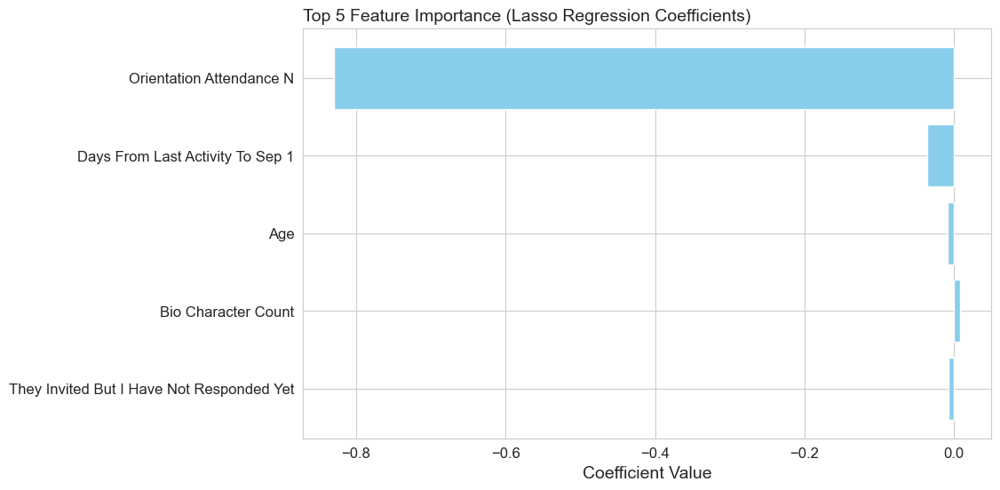

In [ ]:
# Create plots to show the model's results

# Get feature names after preprocessing
num_features = numerical_features
cat_features = pipeline.named_steps['preprocessor'].named_transformers_['cat'].get_feature_names_out(categorical_features)
all_features = np.concatenate([num_features, cat_features])

# Feature importance plot (Top 5 features)
coefficients = lasso_model.coef_
coefficients_sorted = sorted(zip(coefficients, all_features), key=lambda x: abs(x[0]), reverse=True)

# Select the top 5 features
top_5_features = coefficients_sorted[:5]

plt.figure(figsize=(10, 6))
plt.barh([x[1] for x in top_5_features], [x[0] for x in top_5_features], color='skyblue')
plt.xlabel('Coefficient Value')
# Format y-axis labels as title case and replace underscores with spaces
plt.yticks([x[1] for x in top_5_features], [x[1].replace('_', ' ').title() for x in top_5_features])
plt.title('Top 5 Feature Importance (Lasso Regression Coefficients)')
plt.gca().invert_yaxis()
plt.show()

# # Predicted vs. Actual values plot
# plt.figure(figsize=(8, 6))
# plt.scatter(y_test_encoded, y_pred, edgecolors=(0, 0, 0))
# plt.plot([min(y_test_encoded), max(y_test_encoded)], [min(y_test_encoded), max(y_test_encoded)], 'k--', lw=2)
# plt.xlabel('Actual')
# plt.ylabel('Predicted')
# plt.title('Actual vs. Predicted Values')
# plt.show()

# # Residual plot
# residuals = y_test_encoded - y_pred

# plt.figure(figsize=(8, 6))
# sns.residplot(x=y_pred, y=residuals, lowess=True, color='g')
# plt.xlabel('Predicted')
# plt.ylabel('Residuals')
# plt.title('Residuals Plot')
# plt.show()

### Random forest classifier

Random Forest Model Score: 0.9764150943396226
              precision    recall  f1-score   support

           0       1.00      0.83      0.91        29
           1       0.97      1.00      0.99       183

    accuracy                           0.98       212
   macro avg       0.99      0.91      0.95       212
weighted avg       0.98      0.98      0.98       212

Number of Important Features: 77
Number of Total Features: 84
Proportion of Important Features: 92%


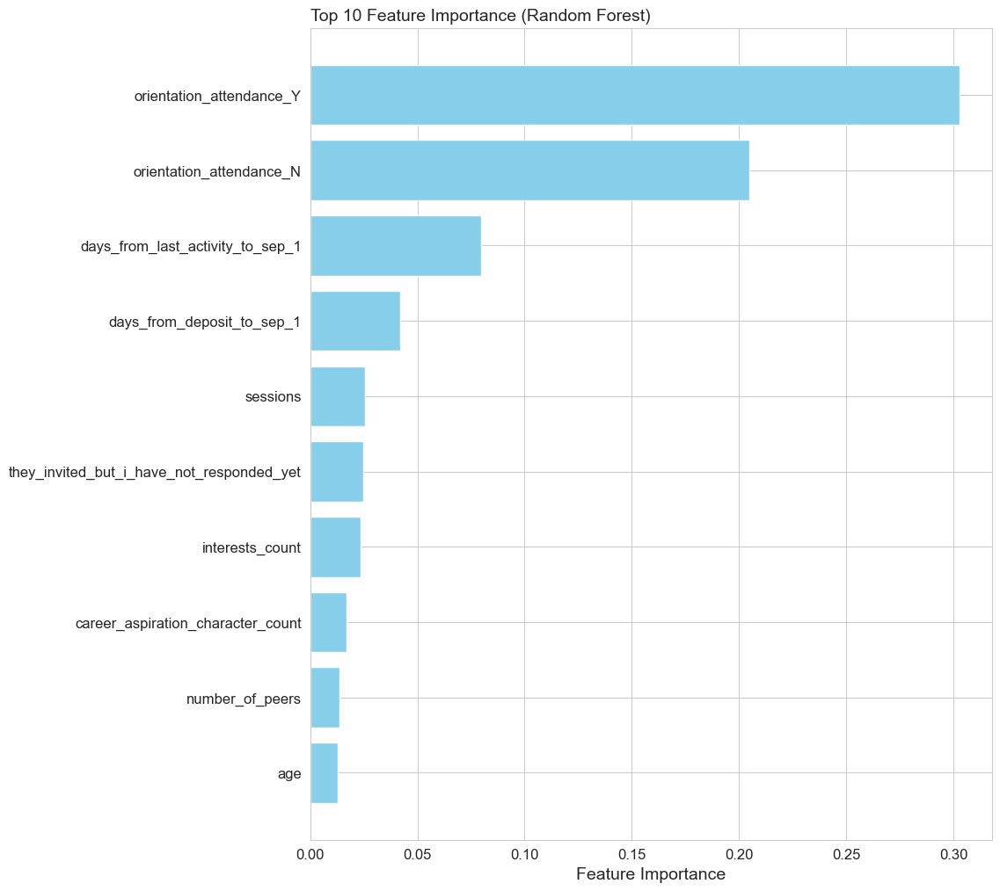

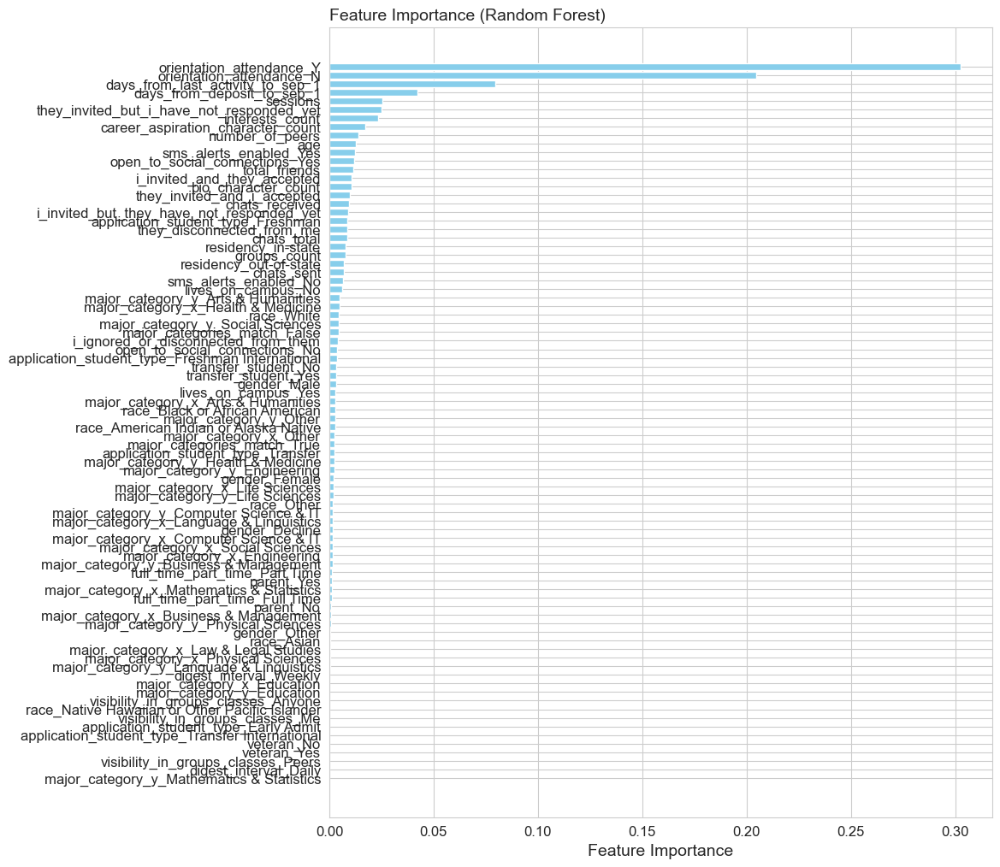

In [ ]:
# Create a random forest model for classifying enrollment status
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

# Create and train the random forest model
rf_model = RandomForestClassifier(n_estimators=50, random_state=42)
rf_model.fit(X_train_processed, y_train_encoded)

# Make predictions on the test set
y_pred_rf = rf_model.predict(X_test_processed)

# Evaluate the model
rf_model_score = rf_model.score(X_test_processed, y_test_encoded)
print(f'Random Forest Model Score: {rf_model_score}')

# Print the classification report
print(classification_report(y_test_encoded, y_pred_rf))

# Get feature importances
feature_importances = rf_model.feature_importances_

# Zip feature importances with feature names and sort based on importance values
importances_sorted = sorted(zip(feature_importances, all_features), key=lambda x: x[0], reverse=True)

# Get the number of important features
num_important_features = sum([1 for importance, _ in importances_sorted if importance > 0])
print(f'Number of Important Features: {num_important_features}')

# Get the number of total features
num_total_features = len(all_features)
print(f'Number of Total Features: {num_total_features}')

# Get the proportion of important features
proportion_important_features = num_important_features / num_total_features
print(f'Proportion of Important Features: {proportion_important_features * 100:0.0f}%')

# Select the top 10 features
top_10_features = importances_sorted[:10]

# Plot the top 10 features
plt.figure(figsize=(10, 12))
plt.barh([x[1] for x in top_10_features], [x[0] for x in top_10_features], color='skyblue')
plt.xlabel('Feature Importance')
plt.title('Top 10 Feature Importance (Random Forest)')
plt.gca().invert_yaxis()
plt.grid(True)
plt.show()

# Select all features and plot all of the feature importances
plt.figure(figsize=(10, 12))
plt.barh([x[1] for x in importances_sorted], [x[0] for x in importances_sorted], color='skyblue')
plt.xlabel('Feature Importance')
plt.title('Feature Importance (Random Forest)')
plt.gca().invert_yaxis()
plt.grid(True)
plt.show()
